# Contents

- [Data Cleaning](#data-cleaning)
- [Visualise missing data using heatmap](#visualise-heatmap)
- [Dropping Initial Columns](#dropping-initial-columns)
- [Minimum and maximum nights columns](#nights-columns)
- [Host Related Columns](#host-related-columns)
- [Property Type](#property_type)
- [Bathrooms, Bedrooms, and Beds](#bathrooms-bedrooms-beds)
- [First_review and last_review](#first-last-review)
- [Review Scores](#review_scores)
- [Dealing with outliers in prices](#price-outliers)
- [Amenities](#amenities)
- [Host Response](#host-response)
- [Correlation Analysis](#correlation-analysis)
- [Modeling](#modeling)

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns

raw_listings = pd.read_csv('listings.csv') # (76984, 74)

# Data Cleaning <a class="anchor" id="data-cleaning"></a>

In [2]:
pd.set_option("display.max_columns", raw_listings.shape[1]) #display all columns
print(raw_listings.shape)
raw_listings.head()

(76984, 74)


,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11551,https://www.airbnb.com/rooms/11551,20201106040109,2020-11-07,Arty and Bright London Apartment in Zone 2,Unlike most rental apartments out there my fla...,Not even 10 minutes by metro from Victoria Sta...,https://a0.muscache.com/pictures/b7afccf4-18e5...,43039,https://www.airbnb.com/users/show/43039,Adriano,2009-10-03,"London, England, United Kingdom","Hello, I'm a friendly Italian man with a very ...",within an hour,100%,100%,f,https://a0.muscache.com/im/pictures/user/47773...,https://a0.muscache.com/im/pictures/user/47773...,Brixton,3.0,3.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"London, United Kingdom",Lambeth,NaN,51.46225,-0.11732,Entire apartment,Entire home/apt,4,NaN,1 bath,1.0,3.0,"[""Cable TV"", ""Coffee maker"", ""Carbon monoxide ...",$97.00,7,190,7,28,1125,1125,8.4,1125.0,NaN,t,0,0,4,279,2020-11-07,192,7,0,2010-03-21,2020-03-26,91.0,9.0,9.0,10.0,10.0,9.0,9.0,NaN,t,2,2,0,0,1.48
1,13913,https://www.airbnb.com/rooms/13913,20201106040109,2020-11-07,Holiday London DB Room Let-on going,My bright double bedroom with a large window h...,Finsbury Park is a friendly melting pot commun...,https://a0.muscache.com/pictures/miso/Hosting-...,54730,https://www.airbnb.com/users/show/54730,Alina,2009-11-16,"London, England, United Kingdom",I am a Multi-Media Visual Artist and Creative ...,within a day,83%,71%,f,https://a0.muscache.com/im/users/54730/profile...,https://a0.muscache.com/im/users/54730/profile...,LB of Islington,3.0,3.0,"['email', 'phone', 'facebook', 'reviews', 'off...",t,t,"Islington, Greater London, United Kingdom",Islington,NaN,51.56802,-0.11121,Private room in apartment,Private room,2,NaN,1 shared bath,1.0,0.0,"[""Cable TV"", ""Bed linens"", ""Coffee maker"", ""Pa...",$40.00,1,29,1,28,29,29,2.8,29.0,NaN,t,30,60,90,365,2020-11-07,21,2,0,2010-08-18,2020-02-22,97.0,10.0,10.0,10.0,10.0,9.0,9.0,NaN,f,2,1,1,0,0.17
2,15400,https://www.airbnb.com/rooms/15400,20201106040109,2020-11-07,Bright Chelsea Apartment. Chelsea!,Lots of windows and light. St Luke's Gardens ...,It is Chelsea.,https://a0.muscache.com/pictures/428392/462d26...,60302,https://www.airbnb.com/users/show/60302,Philippa,2009-12-05,"Kensington, England, United Kingdom","English, grandmother, I have travelled quite ...",within a day,100%,100%,f,https://a0.muscache.com/im/users/60302/profile...,https://a0.muscache.com/im/users/60302/profile...,Chelsea,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,"London, United Kingdom",Kensington and Chelsea,NaN,51.48796,-0.16898,Entire apartment,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Cable TV"", ""Coffee maker"", ""Dryer"", ""Dishes ...",$75.00,10,50,10,28,50,50,11.2,50.0,NaN,t,0,20,50,150,20

In [3]:
pd.set_option("display.max_rows", raw_listings.shape[0])
raw_listings.isnull().sum().sort_values(ascending=False)

neighbourhood_group_cleansed                    76984
license                                         76984
bathrooms                                       76984
calendar_updated                                76984
host_response_time                              37618
host_response_rate                              37618
host_about                                      33765
neighborhood_overview                           29148
neighbourhood                                   29147
host_acceptance_rate                            28432
review_scores_checkin                           23603
review_scores_value                             23602
review_scores_location                          23601
review_scores_accuracy                          23555
review_scores_communication                     23552
review_scores_cleanliness                       23545
review_scores_rating                            23490
first_review                                    21733
last_review                 

# Visualise missing data using heatmap <a class="anchor" id="visualise-heatmap"></a>

Black means data is missing. Beige means data is present. As you can see, there is a lot of missing data.

<AxesSubplot:>

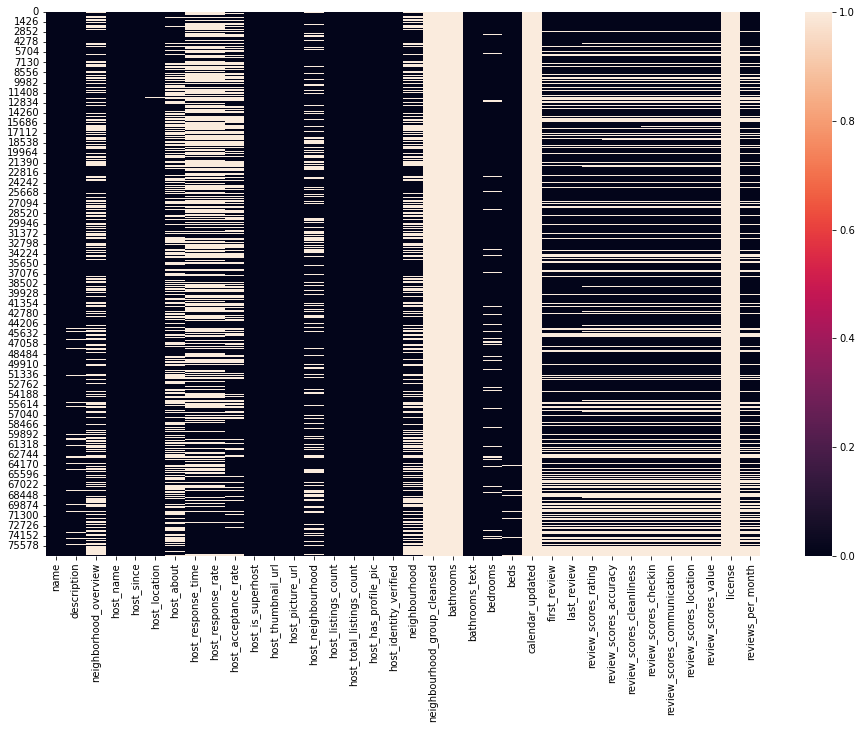

In [4]:
missing_val_cols = raw_listings.columns[raw_listings.isnull().sum() > 0]
fig, ax = plt.subplots(figsize=(16,10)) 
sns.heatmap(raw_listings[missing_val_cols].isnull(), cbar=True)

# Dropping initial columns <a class="anchor" id="dropping-initial-columns"></a>
Due to time constraints I did not do any natural language processing (NLP) in this model, so all the features with free text were dropped. The plot above illustrates that we have columns where most of the values are missing. We will drop these columns as well. We will also be dropping the columns related to the scraping of this dataset as they don't add value to my analysis.

An interesting avenue of future development for this model would be to augment it with NLP — perhaps for sentiment analysis, or looking for keywords, or some sort of fancy Word2Vec type situation that looks for similar listing descriptions and uses this to help guess price based on similar listings.

In [5]:
to_drop = ['listing_url', 'scrape_id', 'name', 'description', 'neighborhood_overview', 'picture_url',
              'host_url', 'host_name', 'host_location', 'host_about', 'host_thumbnail_url', 
               'host_verifications', 'neighbourhood', 'neighbourhood_group_cleansed',
               'bathrooms', 'calendar_updated', 'calendar_last_scraped', 'license', 'host_picture_url', 
               'host_neighbourhood', #'host_response_time'
              ]

listings = raw_listings.drop(to_drop, axis=1)

In [6]:
#Print out the sum of missing values for every column. 
#While we've dropped free text columns, we still need to do a lot of work in regards to missing data.
print(listings.shape)
listings.isna().sum().sort_values(ascending=False)

(76984, 54)


host_response_time                              37618
host_response_rate                              37618
host_acceptance_rate                            28432
review_scores_checkin                           23603
review_scores_value                             23602
review_scores_location                          23601
review_scores_accuracy                          23555
review_scores_communication                     23552
review_scores_cleanliness                       23545
review_scores_rating                            23490
first_review                                    21733
last_review                                     21733
reviews_per_month                               21733
bedrooms                                         4746
beds                                             1080
bathrooms_text                                    160
host_total_listings_count                          11
host_identity_verified                             11
host_has_profile_pic        

# Minimum and maximum nights columns <a class="anchor" id="nights-columns"></a>
We can see that there are multiple columns for minimum and maximum night stays, but we'll only be using two main ones - **minimum_nights** and **maximum_nights**. Multiple columns are presumably due to the fact that minimum or maximum stays vary throughout the year. These columns mostly match the 'default' minimum_nights / maximum_nights columns, so we will drop them.

As a demonstration, below we can see about 85% of the maximum nights across the columns are the same. So it is safe to assume the two main columns are an accurate representation of the data.

In [7]:
print(100 * sum(listings.maximum_nights_avg_ntm == listings.maximum_nights) / len(listings)) 
print(100 * sum(listings.maximum_maximum_nights == listings.maximum_nights) / len(listings))

86.78946274550556
87.77797983996675


In [8]:
listings = listings.drop(['maximum_nights_avg_ntm', 'minimum_minimum_nights', 'minimum_maximum_nights',
                          'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights',
                          'minimum_nights_avg_ntm'], axis=1)
print(listings.shape)
listings.describe().T

(76984, 48)


,count,mean,std,min,25%,50%,75%,max
id,76984.0,2.562503e+07,1.319053e+07,11551.00000,1.509091e+07,2.585057e+07,3.760606e+07,4.626152e+07
host_id,76984.0,9.517164e+07,1.001727e+08,2010.00000,1.612489e+07,4.947226e+07,1.529558e+08,3.745225e+08
host_listings_count,76973.0,2.359588e+01,1.243611e+02,0.00000,1.000000e+00,1.000000e+00,3.000000e+00,1.490000e+03
host_total_listings_count,76973.0,2.359588e+01,1.243611e+02,0.00000,1.000000e+00,1.000000e+00,3.000000e+00,1.490000e+03
latitude,76984.0,5.150993e+01,4.751437e-02,51.28337,5.148414e+01,5.151403e+01,5.153924e+01,5.168523e+01
longitude,76984.0,-1.282558e-01,9.481499e-02,-0.49687,-1.886225e-01,-1.260000e-01,-6.948000e-02,2.885700e-01
accommodates,76984.0,3.077393e+00,1.947671e+00,1.00000,2.000000e+00,2.000000e+00,4.000000e+00,1.600000e+01
bedrooms,72238.0,1.487818e+00,8.849293e-01,1.00000,1.000000e+00,1.000000e+00,2.000000e+00,5.000000e+01
beds,75904.0,1.706814e+00,1.275783e+00,0.00000,1.000000e+00,1.000000e+00,2.000000e+00,5.000000e+01
minimum_nights,76984.0,5.142120e+00,2.247701e+01,1.00000,1.000000e+00,2.000000e+00,3.000000e+00,1.125000e+03


In [9]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76984 entries, 0 to 76983
Data columns (total 48 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            76984 non-null  int64  
 1   last_scraped                                  76984 non-null  object 
 2   host_id                                       76984 non-null  int64  
 3   host_since                                    76973 non-null  object 
 4   host_response_time                            39366 non-null  object 
 5   host_response_rate                            39366 non-null  object 
 6   host_acceptance_rate                          48552 non-null  object 
 7   host_is_superhost                             76973 non-null  object 
 8   host_listings_count                           76973 non-null  float64
 9   host_total_listings_count                     76973 non-null 

array([[<AxesSubplot:title={'center':'id'}>,
        <AxesSubplot:title={'center':'host_id'}>,
        <AxesSubplot:title={'center':'host_is_superhost'}>,
        <AxesSubplot:title={'center':'host_listings_count'}>,
        <AxesSubplot:title={'center':'host_total_listings_count'}>,
        <AxesSubplot:title={'center':'host_has_profile_pic'}>],
       [<AxesSubplot:title={'center':'host_identity_verified'}>,
        <AxesSubplot:title={'center':'latitude'}>,
        <AxesSubplot:title={'center':'longitude'}>,
        <AxesSubplot:title={'center':'accommodates'}>,
        <AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'beds'}>],
       [<AxesSubplot:title={'center':'minimum_nights'}>,
        <AxesSubplot:title={'center':'maximum_nights'}>,
        <AxesSubplot:title={'center':'has_availability'}>,
        <AxesSubplot:title={'center':'availability_30'}>,
        <AxesSubplot:title={'center':'availability_60'}>,
        <AxesSubplot:title={'center':'av

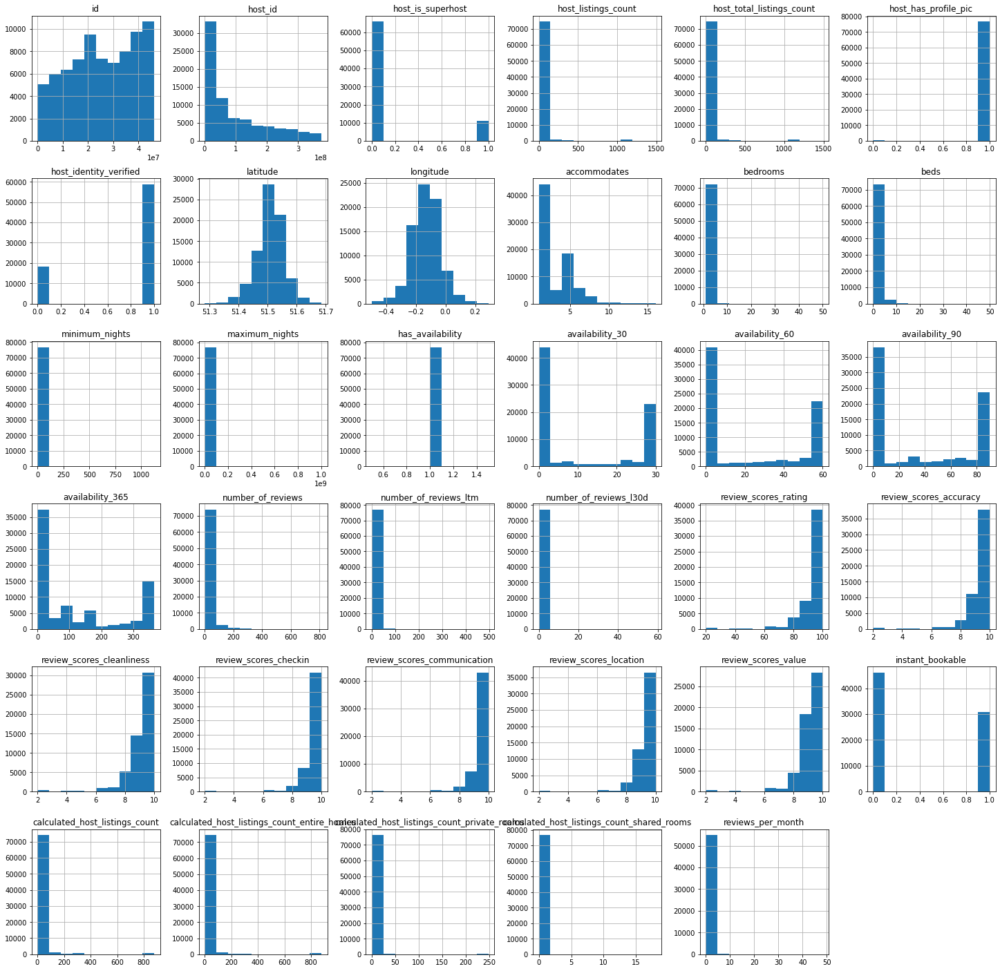

In [10]:
#Check if boolean and numeric columns have enough varibility to make them worth including

# Replace columns with categorical values t and f with 1 and 0
listings = listings.replace({'f': 0, 't': 1})

# Plot the histogram of numerical and boolean columns
listings.hist(figsize=(25, 25))

From the above, it can be seen that Column **has_availability** contains only one category.

There is very little variability in **calculated_host_listings_count_shared_rooms** columns.

So we will consider dropping these columns after we do a correlation analysis.

In [11]:
#listings = listings.drop(['has_availability', 'calculated_host_listings_count_shared_rooms'], axis=1)

We further cleaned the data by removing special characters and converting to float **host_response_rate**, **host_acceptance_rate**, **bathrooms_text** and **price**. We also renamed **bathrooms_text** to **bathrooms**.

In [12]:
# Lambda function to remove special characters and convert to float
strip_and_convert = lambda col: col.str.extract('(\d+)', expand=False).astype(float, errors='ignore')

# strip_and_convert function wil be applied on the below columns
cols_to_numeric = ['host_response_rate', 'host_acceptance_rate', 'bathrooms_text', 'price']
listings[cols_to_numeric] = listings[cols_to_numeric].apply(strip_and_convert)
# Rename bathrooms_text column
listings = listings.rename(columns={'bathrooms_text': 'bathrooms'})
print(listings.shape)
listings.head()

(76984, 48)


,id,last_scraped,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11551,2020-11-07,43039,2009-10-03,within an hour,100.0,100.0,0.0,3.0,3.0,1.0,1.0,Lambeth,51.46225,-0.11732,Entire apartment,Entire home/apt,4,1.0,1.0,3.0,"[""Cable TV"", ""Coffee maker"", ""Carbon monoxide ...",97.0,7,190,1,0,0,4,279,192,7,0,2010-03-21,2020-03-26,91.0,9.0,9.0,10.0,10.0,9.0,9.0,1,2,2,0,0,1.48
1,13913,2020-11-07,54730,2009-11-16,within a day,83.0,71.0,0.0,3.0,3.0,1.0,1.0,Islington,51.56802,-0.11121,Private room in apartment,Private room,2,1.0,1.0,0.0,"[""Cable TV"", ""Bed linens"", ""Coffee maker"", ""Pa...",40.0,1,29,1,30,60,90,365,21,2,0,2010-08-18,2020-02-22,97.0,10.0,10.0,10.0,10.0,9.0,9.0,0,2,1,1,0,0.17
2,15400,2020-11-07,60302,2009-12-05,within a day,100.0,100.0,0.0,1.0,1.0,1.0,1.0,Kensington and Chelsea,51.48796,-0.16898,Entire apartment,Entire home/apt,2,1.0,1.0,1.0,"[""Cable TV"", ""Coffee maker"", ""Dryer"", ""Dishes ...",75.0,10,50,1,0,20,50,150,89,1,0,2009-12-21,2020-03-16,96.0,10.0,10.0,10.0,10.0,10.0,9.0,1,1,1,0,0,0.67
3,17402,2020-11-06,67564,2010-01-04,within an hour,67.0,100.0,1.0,18.0,18.0,1.0,1.0,Westminster,51.52195,-0.14094,Entire apartment,Entire home/apt,6,2.0,3.0,3.0,"[""Bed linens"", ""Coffee maker"", ""Dryer"", ""Paid ...",307.0,4,365,1,25,55,85,330,42,0,0,2011-03-21,2019-11-02,94.0,10.0,9.0,9.0,9.0,10.0,9.0,0,15,15,0,0,0.36
4,17506,2020-11-07,67915,2010-01-05,NaN,NaN,NaN,0.0,3.0,3.0,1.0,1.0,Hammersmith and Fulham,51.47935,-0.19743,Private room in bed and breakfast,Private room,2,1.0,1.0,1.0,"[""TV"", ""Heating"", ""Shower gel"", ""Wifi"", ""Smoke...",150.0,3,21,1,29,59,89,364,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,2,0,2,0,NaN


# Host related columns <a class="anchor" id="host-related-columns"></a>
As seen from the output below, there are 11 rows with missing values in some host related columns.

In [13]:
listings[['host_since', 'host_is_superhost', 'host_listings_count', 'host_has_profile_pic', 'host_identity_verified']].isnull().sum()

host_since                11
host_is_superhost         11
host_listings_count       11
host_has_profile_pic      11
host_identity_verified    11
dtype: int64

In [14]:
#Since it's a small number, we will drop these rows.
listings = listings.dropna(subset=['host_since', 'host_is_superhost', 'host_listings_count', 'host_has_profile_pic', 'host_identity_verified'], axis=0)

listings[['host_since', 'host_is_superhost', 'host_listings_count', 'host_has_profile_pic', 'host_identity_verified']].isnull().sum()

print(listings.shape)

(76973, 48)


In addition, the **host_since** column contains dates in the format **YYYY-MM-DD**.

**Feature engineering**
To be able to use the column in our model, we will transform the **host_since** column to numerical: the new column will be the difference (in days) between the date the dataset was scraped and host_since column.

In [15]:
# Convert to datetime object
listings['last_scraped'] = pd.to_datetime(listings['last_scraped'])
listings['host_since'] = pd.to_datetime(listings['host_since'])

#Created a new feature to calculate the difference in days:
listings['days_host_since'] = (listings['last_scraped'] - listings['host_since']).dt.days

# Remove host_since and other unnecessary columns
listings = listings.drop(['host_since', 'id', 'host_id'], axis=1)

listings['days_host_since'].describe()
#listings.head()

count    76973.000000
mean      1755.958739
std        845.728491
min          2.000000
25%       1130.000000
50%       1807.000000
75%       2342.000000
max       4468.000000
Name: days_host_since, dtype: float64

# Property Type <a class="anchor" id="property_type"></a>
We also need to perform some cleaning in property_type columns as there are too many categories whilst the majority of property types (~80%) belong to 3 categories only, i.e. Entire apartment, Private room in apartment and Private room in house.

Entire apartment                      0.419615
Private room in apartment             0.233225
Private room in house                 0.144674
Entire house                          0.073207
Private room in townhouse             0.020163
Entire condominium                    0.015213
Entire townhouse                      0.012680
Entire serviced apartment             0.012550
Private room in condominium           0.008081
Private room in bed and breakfast     0.006808
Entire loft                           0.005573
Room in boutique hotel                0.005560
Shared room in apartment              0.003858
Room in serviced apartment            0.003858
Room in hotel                         0.003781
Private room in loft                  0.003313
Private room in guest suite           0.002442
Private room in guesthouse            0.002403
Entire guest suite                    0.002364
Shared room in house                  0.001702
Room in aparthotel                    0.001624
Entire guesth

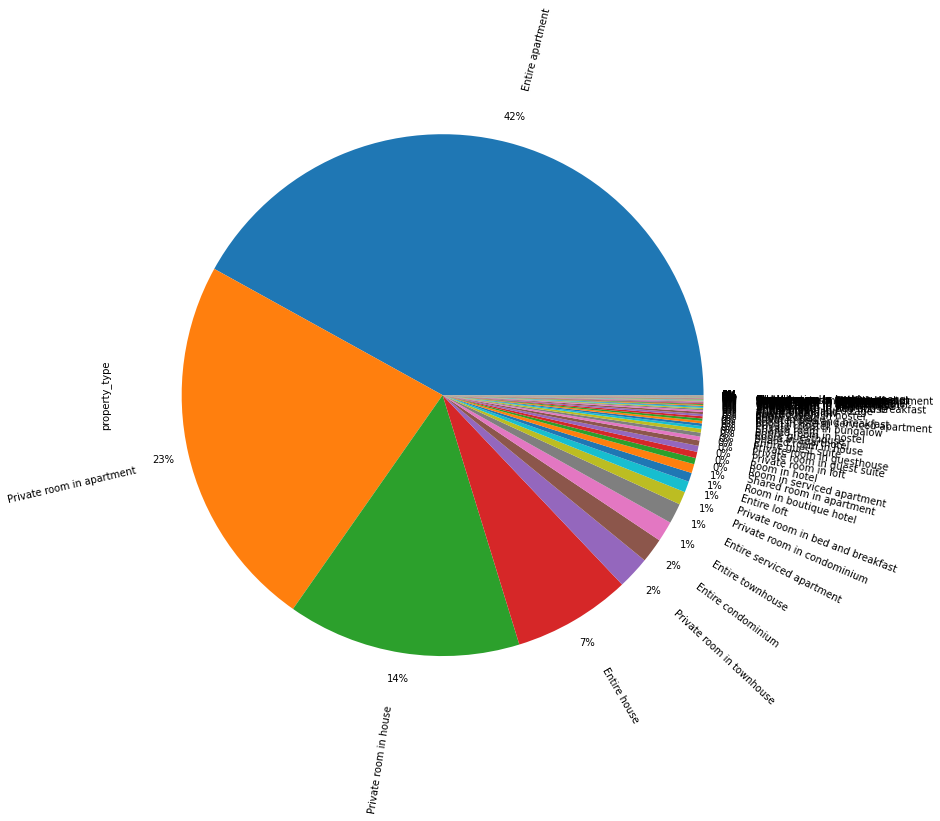

In [16]:
# calculate the percentage of each property type.
display(listings['property_type'].value_counts(normalize=True))

# plot the pie chart of property categories
plt.figure(figsize = (20, 12))
listings['property_type'].value_counts(normalize=True).plot.pie(autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2, rotatelabels=True)
plt.show()

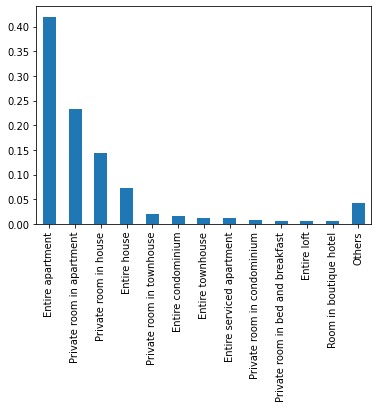

Property types: ['Entire apartment', 'Private room in apartment', 'Private room in house'] make up 79.75 % of the total property types


In [17]:
prob = listings['property_type'].value_counts(normalize=True)
# Setting a threshold. This threshold means that if the frequency of the property types that is less than this value, they will be categorised as 'Others'
threshold = 0.005
mask = prob > threshold
tail_prob = prob.loc[~mask].sum()
prob = prob.loc[mask]
prob['Others'] = tail_prob
prob.plot(kind='bar')
plt.xticks(rotation=90)
plt.show()

print("Property types: {} make up {} % of the total property types".format(
    list(prob[:3].index), 
    round(prob[:3].sum(), 4) * 100
))

In [18]:
# Replace with Other if the frequency of the category is below set threshold (we set it at 0.005, refer to above) 
listings.loc[~listings['property_type'].isin(prob.index.drop('Others')), 'property_type'] = 'Others'
listings['property_type'].value_counts()

Entire apartment                     32299
Private room in apartment            17952
Private room in house                11136
Entire house                          5635
Others                                3283
Private room in townhouse             1552
Entire condominium                    1171
Entire townhouse                       976
Entire serviced apartment              966
Private room in condominium            622
Private room in bed and breakfast      524
Entire loft                            429
Room in boutique hotel                 428
Name: property_type, dtype: int64

# Bathrooms, bedrooms and beds <a class="anchor" id="bathrooms-bedrooms-beds"></a>
Since these are integer values, the missing values will be replaced with median

In [19]:
fill_median = lambda col: col.fillna(col.median())
listings[['bathrooms', 'bedrooms', 'beds']] = listings[['bathrooms', 'bedrooms', 'beds']].apply(fill_median)

listings[['bathrooms', 'bedrooms', 'beds']].isnull().sum()

bathrooms    0
bedrooms     0
beds         0
dtype: int64

# First_review and last_review <a class="anchor" id="first-last-review"></a>
More than 28% of the listings do not have any reviews. This is too many rows to drop. Furthermore, inputing the missing values is also not the best idea since this may skew the distribution significantly. However, the fact that there are missing values may give us meaningful information. This explains that listings with missing values are new bookings that have not yet have reviews. Hence, these values will be kept and will be categorised as 'No reviews'. These columns will be transformed to categorical

In [20]:
100 * listings[['first_review', 'last_review']].isnull().sum() / len(listings)

first_review    28.225482
last_review     28.225482
dtype: float64

In [21]:
listings[['first_review','last_review']].isnull().sum()

first_review    21726
last_review     21726
dtype: int64

In [22]:
# Convert to datetime object
listings['first_review'] = pd.to_datetime(listings['first_review'])
listings['last_review'] = pd.to_datetime(listings['last_review'])

# New feature to calculate number of days between review date and the date the dataset was scrapped
listings['days_since_first_review'] = (listings['last_scraped'] - listings['first_review'])
listings['days_since_last_review'] = (listings['last_scraped'] - listings['last_review'])

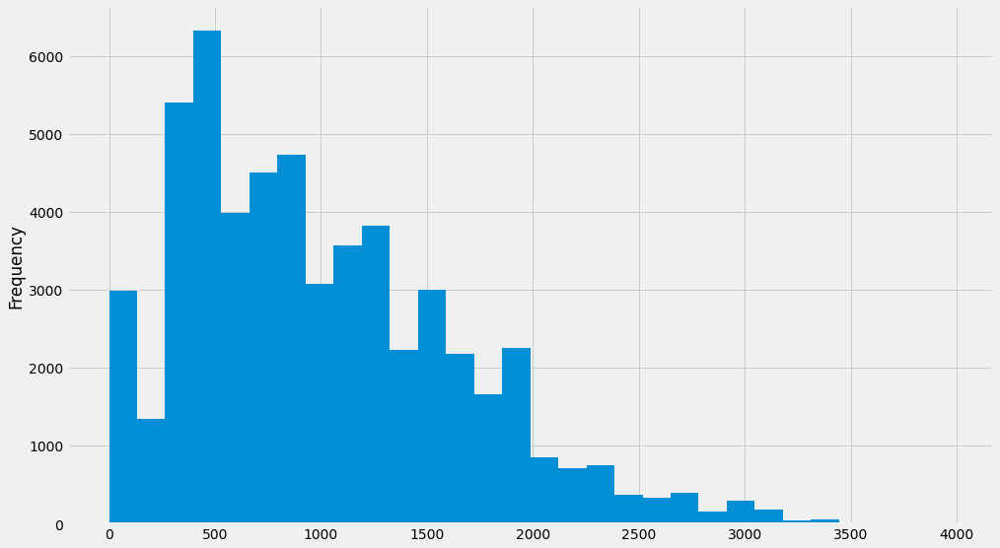

In [23]:
from datetime import datetime, timedelta

plt.style.use('fivethirtyeight')

listings['days_since_first_review'].dt.days.plot(kind='hist', bins=30, figsize=(15,9));
def categorise_col(col_name, new_col, bins, labels):
    listings[new_col] = pd.cut(listings[col_name], bins, labels=labels)
    listings[new_col] = listings[new_col].astype('str')
    listings[new_col] = listings[new_col].str.replace('nan', 'No reviews')
    listings[new_col] = listings[new_col].astype('category')
    
bins = pd.to_timedelta([0, 182, 365, 730, 1460, max(listings['days_since_first_review'])], unit='days')
labels = ['0-6 months',
           '6-12 months',
           '1-2 years',
           '2-3 years',
           '4+ years']
categorise_col('days_since_first_review', 'days_since_first_review_cats', bins, labels)

0

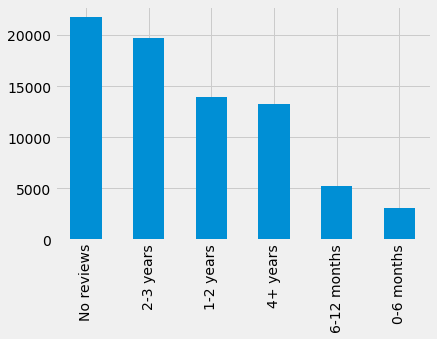

In [24]:
listings['days_since_first_review_cats'].value_counts().plot(kind='bar')
listings['days_since_first_review_cats'].isnull().sum()

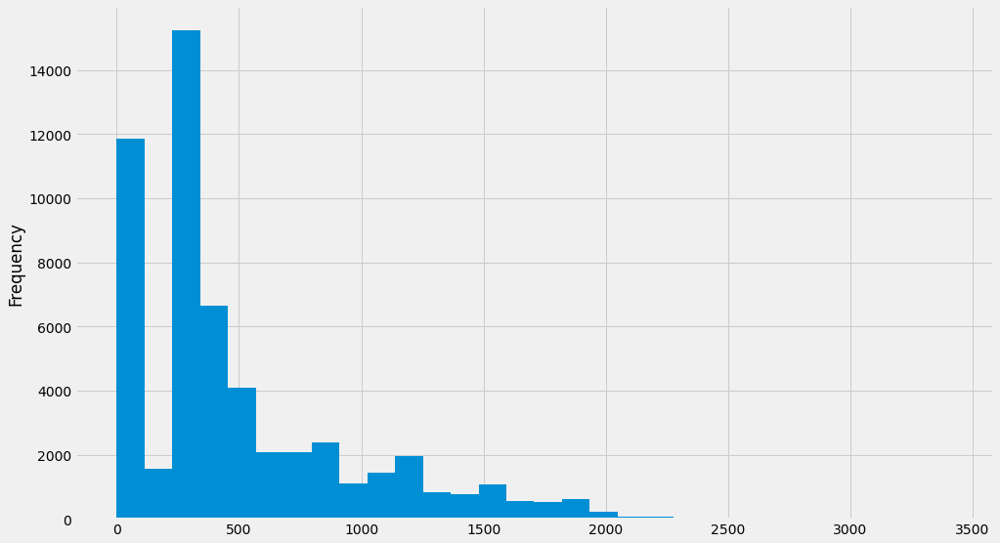

In [25]:
listings['days_since_last_review'].dt.days.plot(kind='hist', bins=30, figsize=(15,9));

0

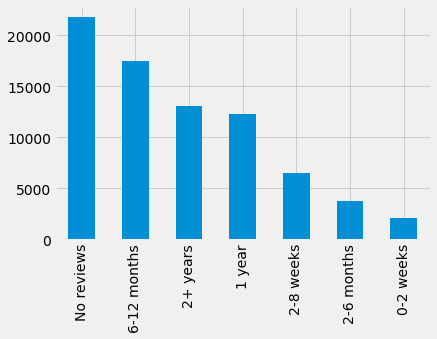

In [26]:
bins2 = pd.to_timedelta([0, 14, 60, 182, 365, 730, max(listings['days_since_last_review'])], unit='days')
labels2 = ['0-2 weeks', '2-8 weeks', '2-6 months', '6-12 months', '1 year', '2+ years']

categorise_col('days_since_last_review', 'days_since_last_review_cats', bins=bins2, labels=labels2)
listings['days_since_last_review_cats'].value_counts().plot(kind='bar');
listings['days_since_last_review_cats'].isnull().sum()

# # Storing the first_review column in a variable for Exploratory Data Analysis
# first_review = listings['first_review']
# review_scores_rating = listings['review_scores_rating']

# Review scores columns <a class="anchor" id="review_scores"></a>
Like above, ratings without reviews will be replaced by No reviews value, and we will also categorise these columns. The histrograms below will be a useful reference for us to decide on bins. Most of the ratings are above 9 points out of 10. reviews_scores_rating is a mean of other columns multiplied by 100 to represent the ratings in percentage.

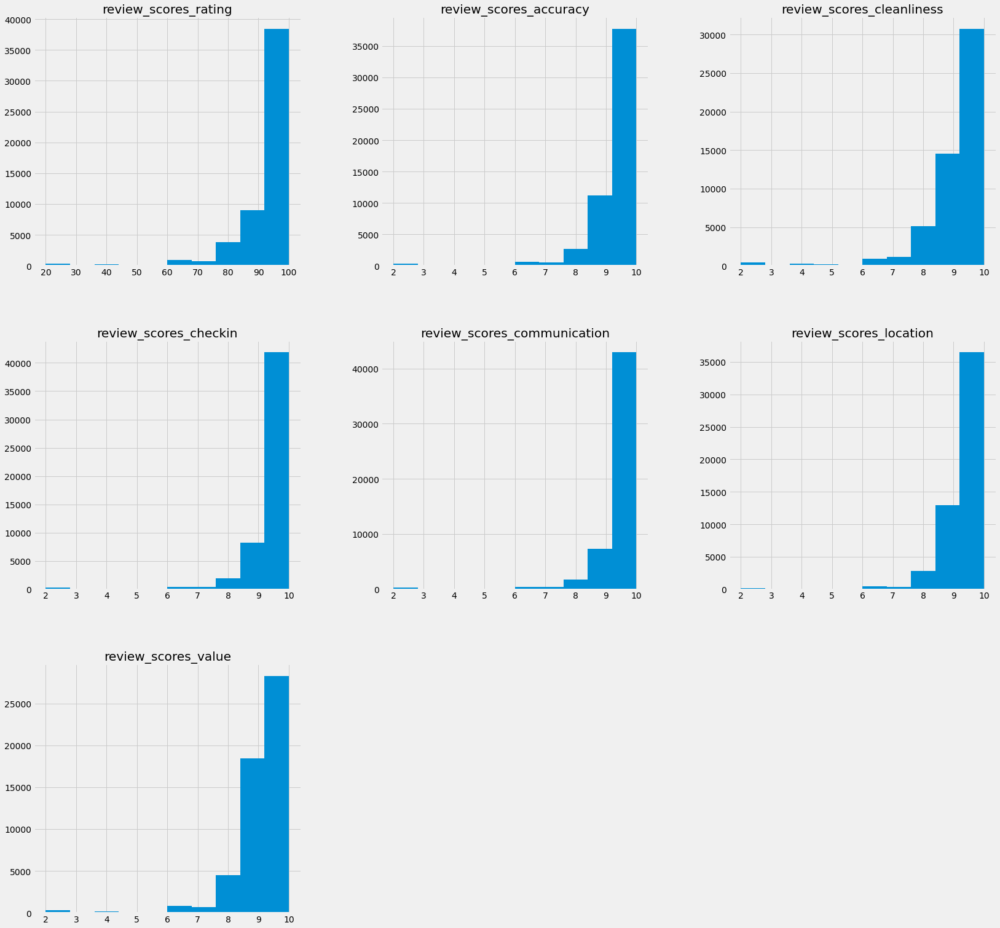

In [27]:
listings.isnull().sum().sort_values(ascending=False)
review_cols = listings.columns[listings.columns.str.startswith("review_scores")]
listings[review_cols].hist(figsize=(25, 25));

In [28]:
# Categorising columns out of 10
review_cols_10 = ['review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value']
new_cols_10 = [s + "_cats" for s in review_cols_10]
bins3 = [0, 8, 9, 10]
labels3 = ['0-8/10', '9/10', '10/10']

for i, col in enumerate(review_cols_10):
    categorise_col(col, new_cols_10[i], bins=bins3, labels=labels3)

# Categorising column out of 10
categorise_col('review_scores_rating', 'review_scores_rating_cat', 
               bins=[0, 80, 95, 100], 
               labels=['0-79/100', '80-94/100', '95-100/100'])

# Dealing with outliers in prices <a class="anchor" id="price-outliers"></a>
Around 2.1% of listings' prices are greater than 4 times the standard deviation of price. So we will remove the rows with values greater than that.

Mean price: £ 100.05314850661921
Median price: £ 74.0
Standard Deviation of Price: £ 94.79769234126957
Four times Standard Deviation: £ 379.19076936507827
Number of outliers:  922
Percentage greater than 4X standard deviation:  2.1786860327647357


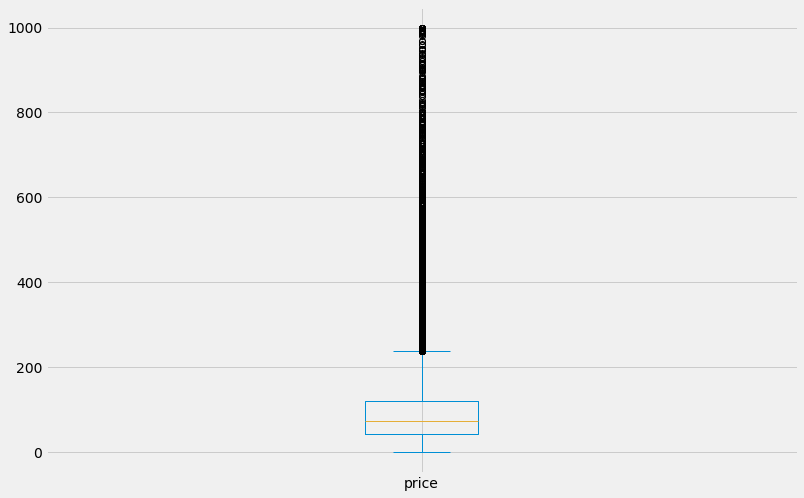

In [29]:
listings['price'].plot(kind='box', figsize=(12, 8));

meanPrice = listings['price'].mean()
medianPrice = listings['price'].median()
stdDevPrice = listings['price'].std()
print('Mean price: £', meanPrice)
print('Median price: £', medianPrice)
print('Standard Deviation of Price: £', stdDevPrice)
print('Four times Standard Deviation: £', 4 *stdDevPrice)

outliers = abs(listings['price'] - meanPrice) > 4 * stdDevPrice

print('Number of outliers: ', outliers.sum())

#6 *std = 568.7611414677139 plus mean = 668 ==> there's 306 above this price
#5 *std = 473.9676178897616 plus mean = 573 ==> there's 477 above this price
#4 *std = 379.17409431180926 plus mean = 479 ==> there's 922 above this price
#3.5 *std = 284.3805707338569 plus mean = 384 ==> there's 1641 above this price
print('Percentage greater than 4X standard deviation: ', 100 * (len(listings[listings['price'] > 379]) / len(listings)))

listings = listings[listings['price'] < 379]

In [30]:
listings.host_response_time.isnull().sum()

37099

In [31]:
listings['host_response_time'] = listings['host_response_time'].fillna('not provided')


In [32]:
listings.host_response_time.isnull().sum()

0

In [33]:
df_not_num = listings.select_dtypes(include = ['O'])
print('There are {} non numerical features including:\n{}'.format(len(df_not_num.columns), df_not_num.columns.tolist()))
df_not_num.head(4)

There are 5 non numerical features including:
['host_response_time', 'neighbourhood_cleansed', 'property_type', 'room_type', 'amenities']


,host_response_time,neighbourhood_cleansed,property_type,room_type,amenities
0,within an hour,Lambeth,Entire apartment,Entire home/apt,"[""Cable TV"", ""Coffee maker"", ""Carbon monoxide ..."
1,within a day,Islington,Private room in apartment,Private room,"[""Cable TV"", ""Bed linens"", ""Coffee maker"", ""Pa..."
2,within a day,Kensington and Chelsea,Entire apartment,Entire home/apt,"[""Cable TV"", ""Coffee maker"", ""Dryer"", ""Dishes ..."
3,within an hour,Westminster,Entire apartment,Entire home/apt,"[""Bed linens"", ""Coffee maker"", ""Dryer"", ""Paid ..."


C:\Users\Emre\AppData\Local\Temp/ipykernel_3812/481141157.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
C:\Users\Emre\AppData\Local\Temp/ipykernel_3812/481141157.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="right")
C:\Users\Emre\AppData\Local\Temp/ipykernel_3812/481141157.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
C:\Users\Emre\AppData\Local\Temp/ipykernel_3812/481141157.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="right")
C:\Users\Emre\AppData\Local\Temp/ipykernel_3812/481141157.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxi

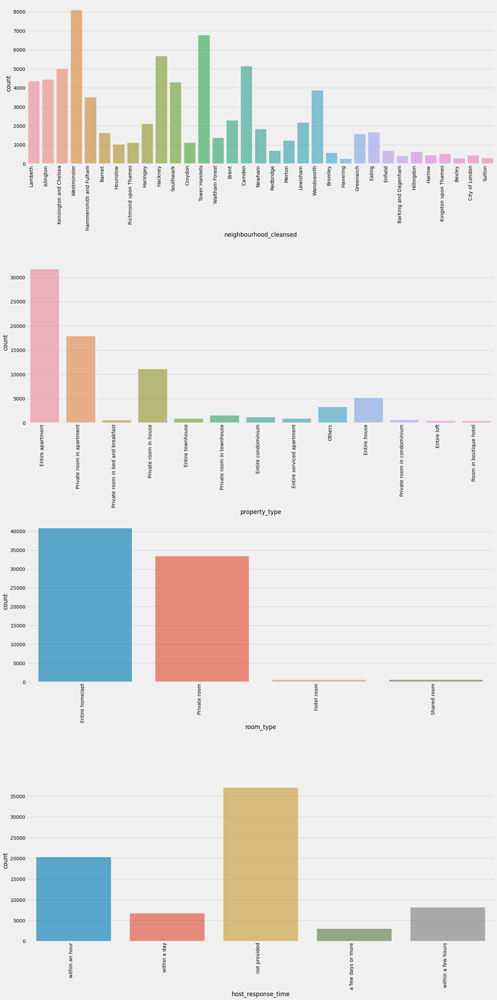

In [34]:
#We are excluding 'amentities' as it is a multi-value feature.

df_not_num = df_not_num[['neighbourhood_cleansed', 'property_type', 'room_type', 'host_response_time']]

#Let's see their distribution

ncols = 1

fig, axes = plt.subplots(round(len(df_not_num.columns) / ncols), ncols, figsize=(20, 40))
#plt.xticks(rotation=90)

for i, ax in enumerate(fig.axes):
    if i < len(df_not_num.columns):
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="right")
        sns.countplot(x=df_not_num.columns[i], alpha=0.7, data=df_not_num, ax=ax)

fig.tight_layout()

# Amenities <a class="anchor" id="amenities"></a>
Given that amenities are stored in a list, we will split the amenities and one-hot encoding them

In [35]:
import re
    
def one_hot_encode_amenities(df):
    '''
    INPUT: 
    df - Original dataframe
    OUTPUT: 
    df_amenities - One-hot encoded dataframe of amenities
        
    Create dummies from list of amenities
    
    '''
    def clean_amenities(row):
        '''
        Remove special characters and split the strings
        '''
        row = re.sub('[^A-Za-z,]+', '', row).split(",")
        return row
        
    df['amenities'] = df['amenities'].apply(clean_amenities)
    
    # Create columns from list of amenities
    df_amenities = df.amenities.str.join('|').str.get_dummies().add_prefix('amenity')
        
    # Include only those amenities that are found in >5% of the listings
    df_amenities = df_amenities[df_amenities.columns[df_amenities.sum() > 0.05 * len(df_amenities)]]
        
    return df_amenities

In [36]:
listings.amenities[5]

'["Coffee maker", "Heating", "Free street parking", "Wifi", "Kitchen", "Smoke alarm", "Washer", "Essentials", "Iron", "Lock on bedroom door", "Hair dryer", "Shampoo", "Hangers", "Laptop-friendly workspace"]'

In [37]:
amenities_df = one_hot_encode_amenities(listings)

In [38]:
listings.shape

(75287, 57)

In [39]:
# Remove amenities column
listings = listings.drop(['amenities'], axis=1)

#Concatenate dataframes
listings = pd.concat([listings, amenities_df], axis=1)
print(listings.shape)
listings.head()

(75287, 103)


,last_scraped,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,...,amenityDryer,amenityElevator,amenityEssentials,amenityExtrapillowsandblankets,amenityFireextinguisher,amenityFirstaidkit,amenityFreeparkingonpremises,amenityFreestreetparking,amenityGardenorbackyard,amenityHairdryer,amenityHangers,amenityHeating,amenityHostgreetsyou,amenityHotwater,amenityIndoorfireplace,amenityIron,amenityKitchen,amenityLaptopfriendlyworkspace,amenityLockbox,amenityLockonbedroomdoor,amenityLongtermstaysallowed,amenityLuggagedropoffallowed,amenityMicrowave,amenityOven,amenityPaidparkingoffpremises,amenityPatioorbalcony,amenityPrivateentrance,amenityPrivatelivingroom,amenityRefrigerator,amenityShampoo,amenityShowergel,amenitySinglelevelhome,amenitySmokealarm,amenityStove,amenityTV,amenityWasher,amenityWifi
0,2020-11-07,within an hour,100.0,100.0,0.0,3.0,3.0,1.0,1.0,Lambeth,51.46225,-0.11732,Entire apartment,Entire home/apt,4,1.0,1.0,3.0,97.0,7,190,1,0,0,4,279,192,7,0,2010-03-21,2020-03-26,91.0,9.0,9.0,10.0,10.0,9.0,...,0,0,1,0,1,0,0,0,0,1,1,1,0,1,0,1,1,1,1,0,1,0,1,1,1,0,0,0,1,0,0,0,1,1,1,1,1
1,2020-11-07,within a day,83.0,71.0,0.0,3.0,3.0,1.0,1.0,Islington,51.56802,-0.11121,Private room in apartment,Private room,2,1.0,1.0,0.0,40.0,1,29,1,30,60,90,365,21,2,0,2010-08-18,2020-02-22,97.0,10.0,10.0,10.0,10.0,9.0,...,1,0,1,1,1,0,0,1,0,1,1,1,1,1,0,1,1,1,0,1,1,1,0,1,1,1,0,0,1,1,0,0,1,1,1,1,1
2,2020-11-07,within a day,100.0,100.0,0.0,1.0,1.0,1.0,1.0,Kensington and Chelsea,51.48796,-0.16898,Entire apartment,Entire home/apt,2,1.0,1.0,1.0,75.0,10,50,1,0,20,50,150,89,1,0,2009-12-21,2020-03-16,96.0,10.0,10.0,10.0,10.0,10.0,...,1,0,1,0,1,0,0,0,0,1,1,1,0,1,0,1,1,1,0,0,1,1,1,0,0,0,0,0,1,1,0,0,1,0,1,1,1
3,2020-11-06,within an hour,67.0,100.0,1.0,18.0,18.0,1.0,1.0,Westminster,51.52195,-0.14094,Entire apartment,Entire home/apt,6,2.0,3.0,3.0,307.0,4,365,1,25,55,85,330,42,0,0,2011-03-21,2019-11-02,94.0,10.0,9.0,9.0,9.0,10.0,...,1,1,1,0,0,0,0,0,0,1,1,1,0,1,0,1,1,1,1,0,1,0,1,1,1,0,0,0,1,1,0,0,1,1,1,1,1
4,2020-11-07,not provided,NaN,NaN,0.0,3.0,3.0,1.0,1.0,Hammersmith and Fulham,51.47935,-0.19743,Private room in bed and breakfast,Private room,2,1.0,1.0,1.0,150.0,3,21,1,29,59,89,364,0,0,0,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,1,0,0,0,0,0,0,1,1,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,0,1


# Host_response_rate, host_acceptance_rate, reviews_per_month <a class="anchor" id="host-response"></a>
Empty host_response_rate, host_acceptance_rate, reviews_per_month will be filled by mean values

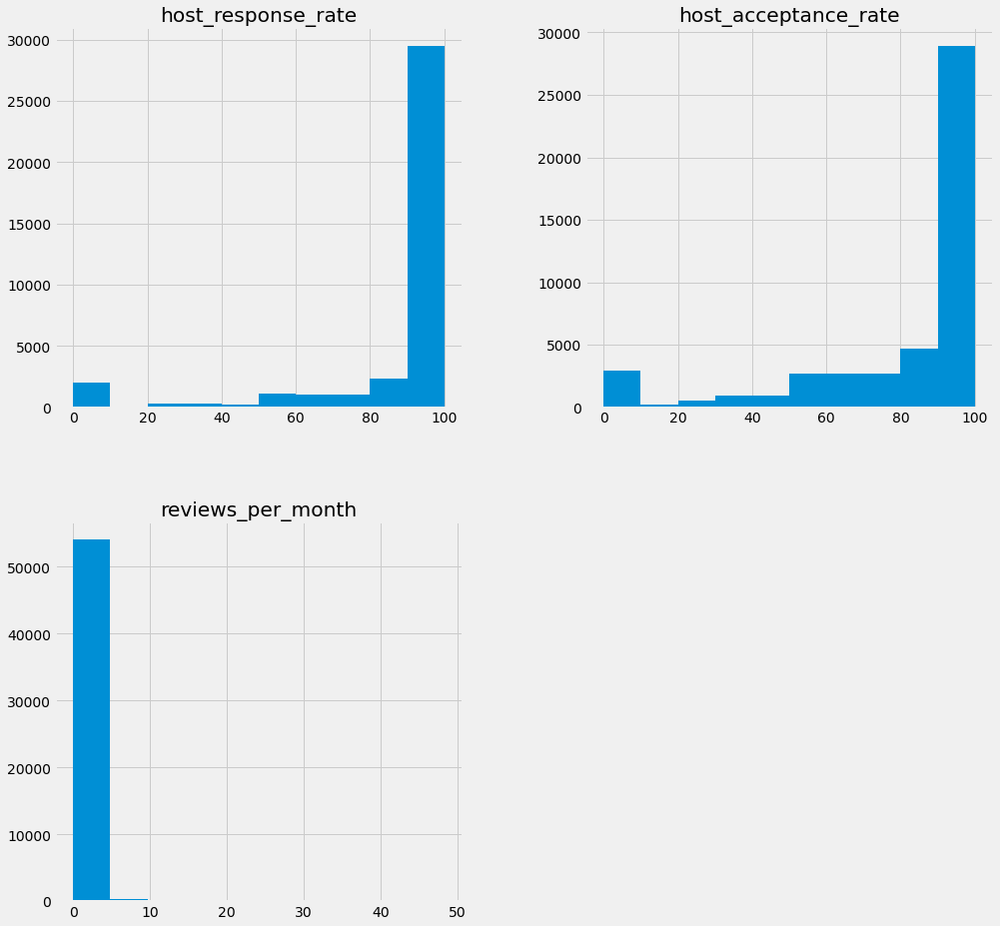

In [40]:
fill_mean = lambda col: col.fillna(col.mean())
listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']].hist(figsize=(15, 15));
listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']] = listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']].apply(fill_mean)

In [41]:
listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']].isnull().sum()

host_response_rate      0
host_acceptance_rate    0
reviews_per_month       0
dtype: int64

array([[<AxesSubplot:title={'center':'host_response_rate'}>,
        <AxesSubplot:title={'center':'host_acceptance_rate'}>],
       [<AxesSubplot:title={'center':'reviews_per_month'}>,
        <AxesSubplot:>]], dtype=object)

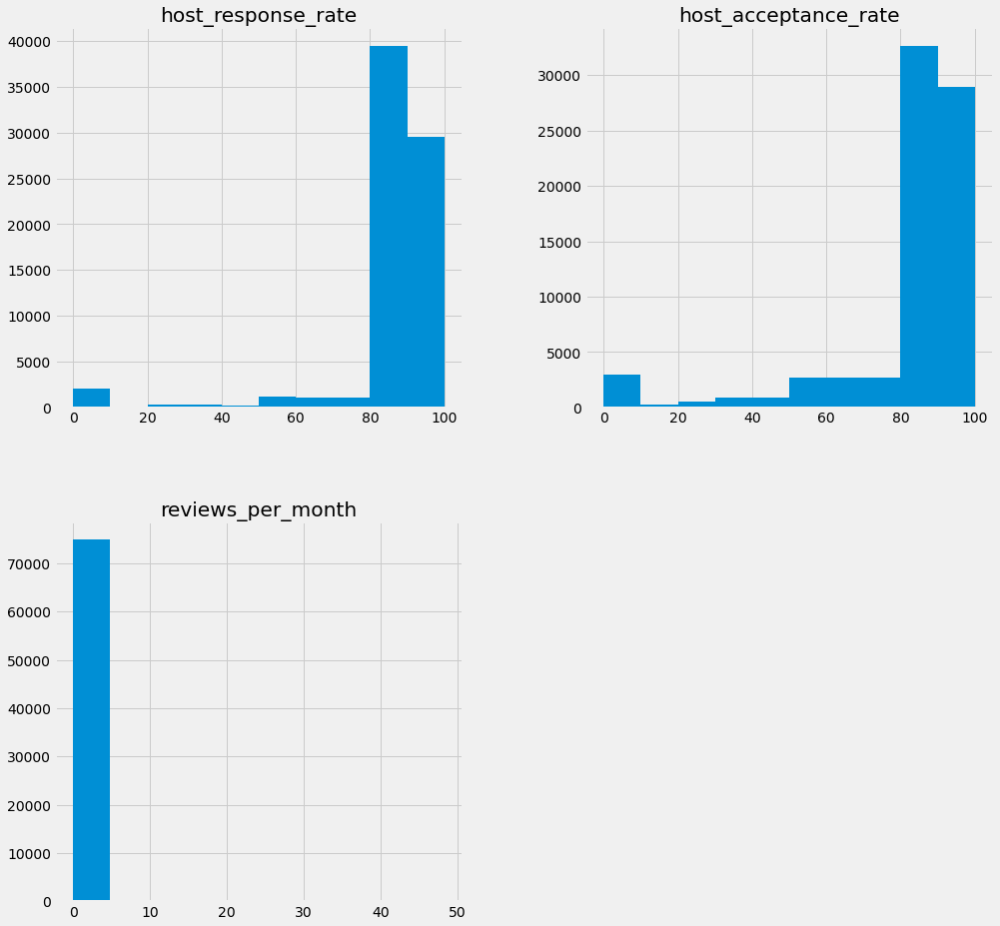

In [42]:
listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']].hist(figsize=(15, 15))

In [43]:
# Dropping initial and intermidiate columns
review_cols = listings.columns[listings.columns.str.startswith("review_scores")]
listings = listings.drop(review_cols, axis=1)
listings = listings.drop(columns=['last_review', 
                                  'days_since_last_review', 'days_since_first_review', 
                                  'first_review', 'last_scraped','host_listings_count'])

# Include all object and category columns
cat_columns = listings.select_dtypes(include=['object', 'category']).columns
for col in cat_columns:    
    listings = pd.concat([listings.drop(col, axis=1), pd.get_dummies(listings[col], prefix=col, prefix_sep='_', drop_first=True)], axis=1) 
    
print(listings.shape)
listings.head()

(75287, 139)


,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,days_host_since,amenityAirconditioning,amenityBathtub,amenityBedlinens,amenityBreakfast,amenityCableTV,amenityCarbonmonoxidealarm,amenityCoffeemaker,...,neighbourhood_cleansed_Lewisham,neighbourhood_cleansed_Merton,neighbourhood_cleansed_Newham,neighbourhood_cleansed_Redbridge,neighbourhood_cleansed_Richmond upon Thames,neighbourhood_cleansed_Southwark,neighbourhood_cleansed_Sutton,neighbourhood_cleansed_Tower Hamlets,neighbourhood_cleansed_Waltham Forest,neighbourhood_cleansed_Wandsworth,neighbourhood_cleansed_Westminster,property_type_Entire condominium,property_type_Entire house,property_type_Entire loft,property_type_Entire serviced apartment,property_type_Entire townhouse,property_type_Others,property_type_Private room in apartment,property_type_Private room in bed and breakfast,property_type_Private room in condominium,property_type_Private room in house,property_type_Private room in townhouse,property_type_Room in boutique hotel,room_type_Hotel room,room_type_Private room,room_type_Shared room,days_since_first_review_cats_1-2 years,days_since_first_review_cats_2-3 years,days_since_first_review_cats_4+ years,days_since_first_review_cats_6-12 months,days_since_first_review_cats_No reviews,days_since_last_review_cats_1 year,days_since_last_review_cats_2+ years,days_since_last_review_cats_2-6 months,days_since_last_review_cats_2-8 weeks,days_since_last_review_cats_6-12 months,days_since_last_review_cats_No reviews
0,100.000000,100.000000,0.0,3.0,1.0,1.0,51.46225,-0.11732,4,1.0,1.0,3.0,97.0,7,190,1,0,0,4,279,192,7,0,1,2,2,0,0,1.4800,4053,0,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
1,83.000000,71.000000,0.0,3.0,1.0,1.0,51.56802,-0.11121,2,1.0,1.0,0.0,40.0,1,29,1,30,60,90,365,21,2,0,0,2,1,1,0,0.1700,4009,0,1,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
2,100.000000,100.000000,0.0,1.0,1.0,1.0,51.48796,-0.16898,2,1.0,1.0,1.0,75.0,10,50,1,0,20,50,150,89,1,0,1,1,1,0,0,0.6700,3990,1,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
3,67.000000,100.000000,1.0,18.0,1.0,1.0,51.52195,-0.14094,6,2.0,3.0,3.0,307.0,4,365,1,25,55,85,330,42,0,0,0,15,15,0,0,0.3600,3959,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0
4,87.778831,81.330735,0.0,3.0,1.0,1.0,51.47935,-0.19743,2,1.0,1.0,1.0,150.0,3,21,1,29,59,89,364,0,0,0,0,2,0,2,0,0.6574,3959,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1


# Correlation analysis<a class="anchor" id="correlation-analysis"></a>

# Pearson correlation with Price 

In [44]:
dfc = pd.DataFrame(listings.corr(method="pearson")["price"])
dfc.reset_index(inplace=True)
dfc.columns = ["features", "correlation_with_price"]
dfc.sort_values("correlation_with_price", ascending=False)
df1 = dfc[dfc["correlation_with_price"] > 0.1]
corr_features = df1["features"].values
corr_features.tolist().append("price")
print(df1.shape)
df1.sort_values(by=['correlation_with_price'], ascending=False)

(33, 2)


,features,correlation_with_price
12,price,1.000000
8,accommodates,0.599245
10,bedrooms,0.542839
11,beds,0.483499
9,bathrooms,0.356858
114,property_type_Entire house,0.297117
74,amenityTV,0.292626
39,amenityDishwasher,0.254802
25,calculated_host_listings_count_entire_homes,0.242251
24,calculated_host_listings_count,0.228065


33


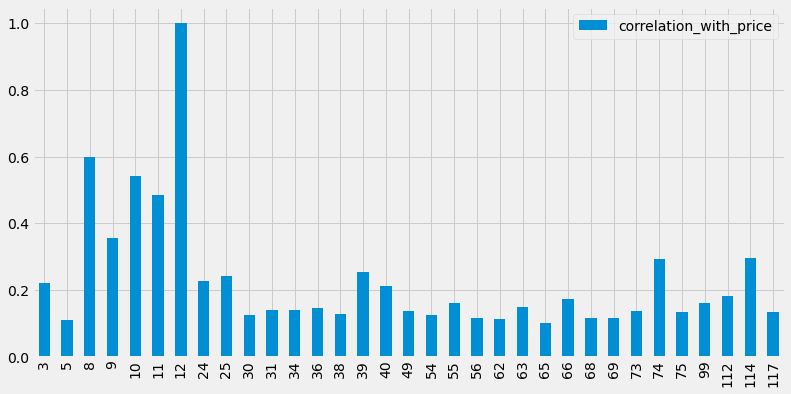

In [45]:
df1.plot( kind='bar', figsize=(12,6));

#Saving it as a variable to apply model to.
df1_col = ['host_total_listings_count', 'host_identity_verified', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'amenity_Air_conditioning_', 'amenity_Bathtub_', 'amenity_Cable_TV_', 'amenity_Coffee_maker_', 'amenity_Dishes_and_silverware_', 'amenity_Dishwasher_', 'amenity_Dryer_', 'amenity_Hair_dryer_', 'amenity_Indoor_fireplace_', 'amenity_Iron_', 'amenity_Kitchen_', 'amenity_Microwave_', 'amenity_Oven_', 'amenity_Patio_or_balcony_', 'amenity_Private_entrance_', 'amenity_Refrigerator_', 'amenity_Shampoo_', 'amenity_Stove_', 'amenity_TV_', 'amenity_Washer_', 'neighbourhood_cleansed_Kensington and Chelsea', 'neighbourhood_cleansed_Westminster', 'property_type_Entire house', 'property_type_Entire townhouse']
print(len(df1_col))

# Spearman correlation with price

Spearman's corelation measures monotonic associations between two variables i.e. strictly increasing or decreasing

In [46]:
dfs = pd.DataFrame(listings.corr(method="spearman")["price"])
dfs.reset_index(inplace=True)
dfs.columns = ["features", "correlation_with_price"]
dfs.sort_values("correlation_with_price", ascending=False)
df2 = dfs[dfs["correlation_with_price"] > 0.1]
corr_features = df2["features"].values
corr_features.tolist().append("price")
print(df2.shape)
df2.sort_values(by=['correlation_with_price'], ascending=False)

(38, 2)


,features,correlation_with_price
12,price,1.000000
8,accommodates,0.650061
25,calculated_host_listings_count_entire_homes,0.605641
10,bedrooms,0.556734
11,beds,0.517831
74,amenityTV,0.342270
9,bathrooms,0.311029
114,property_type_Entire house,0.266364
39,amenityDishwasher,0.260979
40,amenityDryer,0.216050


38

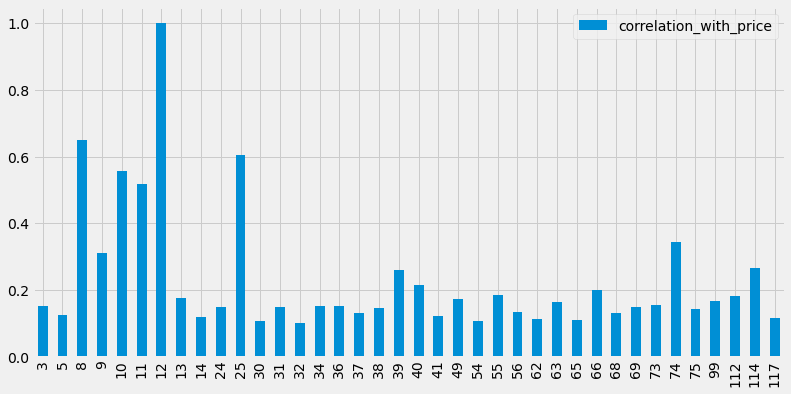

In [48]:
df2.plot( kind='bar', figsize=(12,6));

#Saving it as a variable to apply model on the features selected.
df2_col = ['amenity_Bed_linens_', 'maximum_nights', 'amenity_Elevator_', 'amenity_Cooking_basics_', 'minimum_nights','host_total_listings_count', 'host_identity_verified', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'amenity_Air_conditioning_', 'amenity_Bathtub_', 'amenity_Cable_TV_', 'amenity_Coffee_maker_', 'amenity_Dishes_and_silverware_', 'amenity_Dishwasher_', 'amenity_Dryer_', 'amenity_Hair_dryer_', 'amenity_Indoor_fireplace_', 'amenity_Iron_', 'amenity_Kitchen_', 'amenity_Microwave_', 'amenity_Oven_', 'amenity_Patio_or_balcony_', 'amenity_Private_entrance_', 'amenity_Refrigerator_', 'amenity_Shampoo_', 'amenity_Stove_', 'amenity_TV_', 'amenity_Washer_', 'neighbourhood_cleansed_Kensington and Chelsea', 'neighbourhood_cleansed_Westminster', 'property_type_Entire house', 'property_type_Entire townhouse']
len(df2_col)

# PCA

In [49]:
from sklearn.decomposition import PCA
from sklearn import preprocessing

features = listings
# Create and fit a PCA model
pca = PCA(n_components=2)

pca.fit(features)

PCA(n_components=2)

In [50]:
# Look at the component loadings. 
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

[1.69436631e+13 7.15083087e+05]
[9.99999954e-01 4.22035689e-08]


The first component captures 99% of the variance. **What does this mean?**

The second component captures very little. That's a bit suspicous, because it suggests that all the many of the variables are covariant. Let's plot them and look at the loadings.

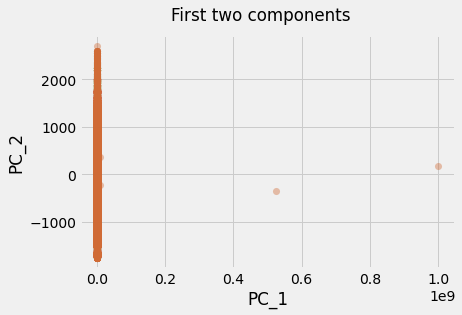

In [51]:
# project the features into these principle components
projectedAxes = pca.transform(features)

plt.figure(1)
plt.suptitle('First two components')
plt.xlabel('PC_1')
plt.ylabel('PC_2')
plt.scatter(projectedAxes[:,0], projectedAxes[:,1], c = "#D06B36", s = 50, alpha = 0.4, linewidth=0)

In [52]:
loadings=pd.DataFrame(pca.components_,columns=listings.columns.values[:])
loadings=loadings.transpose()
loadings=loadings.abs()
loadings=loadings.sort_values(by =0,ascending=False)
print(loadings)

                                                            0             1
maximum_nights                                   1.000000e+00  9.418907e-07
days_host_since                                  9.458375e-07  9.998503e-01
availability_365                                 2.854046e-07  1.246307e-02
price                                            7.834988e-08  1.579331e-03
number_of_reviews                                6.095578e-08  6.854404e-03
availability_90                                  5.573521e-08  5.959634e-03
host_acceptance_rate                             3.646329e-08  3.406266e-03
availability_60                                  3.607265e-08  3.914837e-03
host_total_listings_count                        2.346563e-08  3.342820e-03
calculated_host_listings_count                   1.909357e-08  2.883910e-03
calculated_host_listings_count_entire_homes      1.805047e-08  2.503733e-03
availability_30                                  1.703599e-08  1.931638e-03
host_respons

In [53]:
listings.maximum_nights

0              190
1               29
2               50
3              365
4               21
5             1120
6               21
7               22
8              365
9               21
10              21
11             730
12              90
13              14
14            1125
15              25
16               7
17              10
18              31
19            1124
20            1125
21              50
22             730
23              14
24              14
25            1125
26              30
27              90
28              90
29             200
30               7
31              21
32              30
33            1095
34            1125
35             365
36              42
37              14
38             365
39             730
40             365
41             730
42            1125
43             730
44             730
45             730
46            1125
47             730
48              60
49              90
50              31
51               4
52          

(array([7.5285e+04, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([1.00000000e+00, 5.00000009e+07, 1.00000001e+08, 1.50000001e+08,
        2.00000001e+08, 2.50000000e+08, 3.00000000e+08, 3.50000000e+08,
        4.00000000e+08, 4.50000000e+08, 5.00000000e+08, 5.50000000e+08,
        6.00000000e+08, 6.50000000e+08, 7.00000000e+08, 7.50000000e+08,
        7.99999999e+08, 8.49999999e+08, 8.99999999e+08, 9.49999999e+08,
        9.99999999e+08]),
 <BarContainer object of 20 artists>)

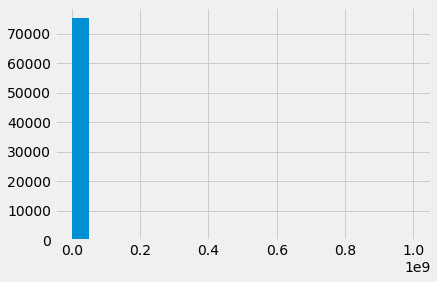

In [54]:
plt.hist(listings['maximum_nights'],bins=20)

(array([1595., 3774., 4478., 4596., 4052., 5464., 5182., 7651., 9419.,
        6646., 6868., 4326., 3672., 3500., 2376., 1103.,  378.,  135.,
          48.,   24.]),
 array([2.0000e+00, 2.2530e+02, 4.4860e+02, 6.7190e+02, 8.9520e+02,
        1.1185e+03, 1.3418e+03, 1.5651e+03, 1.7884e+03, 2.0117e+03,
        2.2350e+03, 2.4583e+03, 2.6816e+03, 2.9049e+03, 3.1282e+03,
        3.3515e+03, 3.5748e+03, 3.7981e+03, 4.0214e+03, 4.2447e+03,
        4.4680e+03]),
 <BarContainer object of 20 artists>)

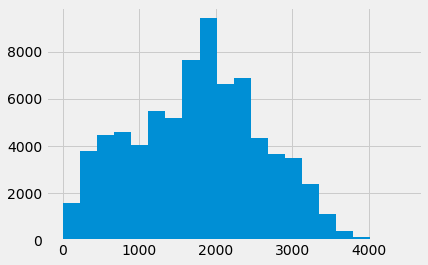

In [55]:
plt.hist(listings['days_host_since'],bins=20)

In [56]:
#Dropped Maximum nights, days_host_since, host_total_listings_count, availability_365, 
#calculated_host_listings_count, calculated_host_listings_count_entire_homes, price

[11.1134219  5.4503103]
[0.08053097 0.03949448]
                                                        0         1
amenityRefrigerator                              0.249581  0.018677
amenityDishesandsilverware                       0.243321  0.014660
amenityOven                                      0.241657  0.017989
amenityCookingbasics                             0.235413  0.025337
amenityStove                                     0.232491  0.010558
amenityMicrowave                                 0.223230  0.020354
amenityBedlinens                                 0.206560  0.027267
amenityHotwater                                  0.196489  0.070568
amenityDishwasher                                0.191934  0.074723
amenityCoffeemaker                               0.178466  0.015308
amenityLongtermstaysallowed                      0.165001  0.062961
amenityExtrapillowsandblankets                   0.149104  0.078530
amenityPatioorbalcony                            0.139935  0.008111


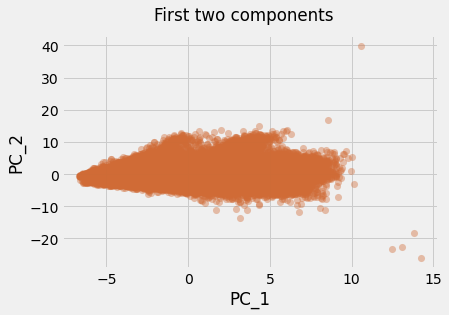

In [57]:
#going to repeat the above but scale the features
features = listings

features=preprocessing.scale(features)

# Create and fit a PCA model
pca = PCA(n_components=2)

pca.fit(features)

# Look at the component loadings. 
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

# project the features into these principle components
projectedAxes = pca.transform(features)

plt.figure(1)
plt.suptitle('First two components')
plt.xlabel('PC_1')
plt.ylabel('PC_2')
plt.scatter(projectedAxes[:,0], projectedAxes[:,1], c = "#D06B36", s = 50, alpha = 0.4, linewidth=0)

loadings=pd.DataFrame(pca.components_,columns=listings.columns.values[:])
loadings=loadings.transpose()
loadings=loadings.abs()
loadings=loadings.sort_values(by =0,ascending=False)
print(loadings)

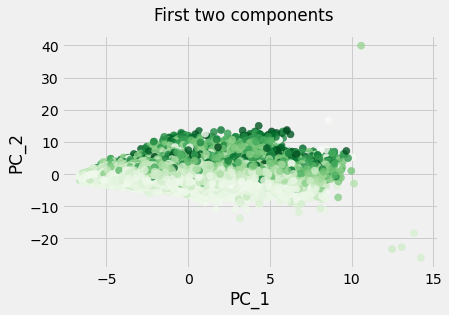

In [58]:
plt.figure(1)
plt.suptitle('First two components')
plt.xlabel('PC_1')
plt.ylabel('PC_2')
plt.scatter(projectedAxes[:,0], projectedAxes[:,1], c = listings['price'], cmap = plt.cm.Greens, s = 50, alpha = 0.8)

(75287, 138)
75287


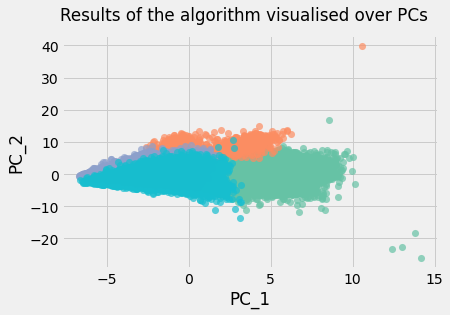

In [59]:
from sklearn.cluster import KMeans

features = listings.iloc[:,1:]
knownLabels=listings.iloc[:,0]

features=preprocessing.scale(features)

print(features.shape)
print(len(knownLabels))

#computing K-Means with K = 3 (3 clusters)
kmeansModel = KMeans(init='random', n_clusters=4, n_init=10)
kmeansModel.fit_predict(features)
clusterLabels = kmeansModel.labels_

pca = PCA(n_components=2)

# We first fit a PCA model to the data
pca.fit(features)

# have a look at the components directly if we can notice any interesting structure
projectedAxes = pca.transform(features)
projectedAxes=pd.DataFrame(projectedAxes) #put into a dataframe so easier to filter

plt.figure(1)
plt.suptitle('Results of the algorithm visualised over PCs')
plt.xlabel('PC_1')
plt.ylabel('PC_2')
#draw 3 scatterplots on top of each other, using a different colour for each
plt.scatter(projectedAxes[clusterLabels==0][0], projectedAxes[clusterLabels==0][1], c = "#66c2a5", s = 50, alpha = 0.7, linewidth=0) # greenish
plt.scatter(projectedAxes[clusterLabels==1][0], projectedAxes[clusterLabels==1][1], c = "#fc8d62", s = 50, alpha = 0.7, linewidth=0) # orangish
plt.scatter(projectedAxes[clusterLabels==2][0], projectedAxes[clusterLabels==2][1], c = "#8da0cb", s = 50, alpha = 0.7, linewidth=0) # blueish
plt.scatter(projectedAxes[clusterLabels==3][0], projectedAxes[clusterLabels==3][1], c = "#17becf", s = 50, alpha = 0.7, linewidth=0) # blueish
#plt.scatter(projectedAxes[clusterLabels==4][0], projectedAxes[clusterLabels==4][1], c = "#bcbd22", s = 50, alpha = 0.7, linewidth=0) # blueish
#plt.scatter(projectedAxes[clusterLabels==5][0], projectedAxes[clusterLabels==5][1], c = "#7f7f7f", s = 50, alpha = 0.7, linewidth=0) # blueish
#plt.scatter(projectedAxes[clusterLabels==6][0], projectedAxes[clusterLabels==6][1], c = "#e377c2", s = 50, alpha = 0.7, linewidth=0) # blueish
plt.show()


#'#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'

# Using Panda's corr() method calculates the relationship between each feature in relation to price

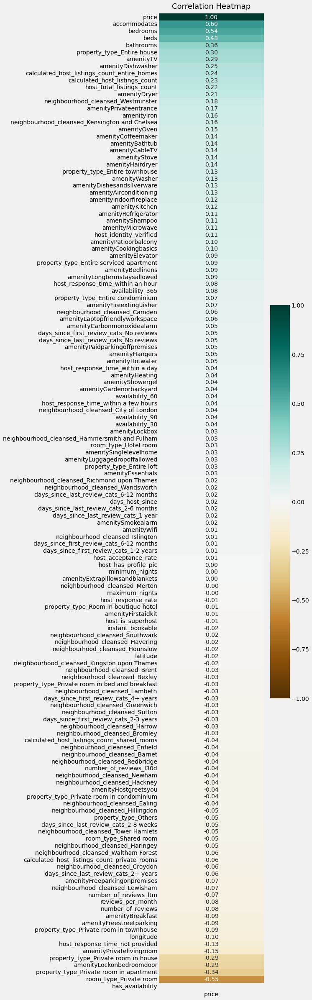

In [61]:
plt.figure(figsize=(5, 40))
feature_correlation = listings.corr()[['price']].sort_values(by='price', ascending=False)
# feature_correlation = feature_correlation[(feature_correlation > 0.1) & (feature_correlation != 1)]
# Show all features.
# heatmap = sns.heatmap(feature_correlation, vmin=-1, vmax=1, annot=True, fmt=".2f", cmap='BrBG')

# Show only price feature
heatmap = sns.heatmap(feature_correlation, vmin=-1, vmax=1, annot=True, fmt=".2f", cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

Text(0.5, 1.0, 'Correlation Heatmap')

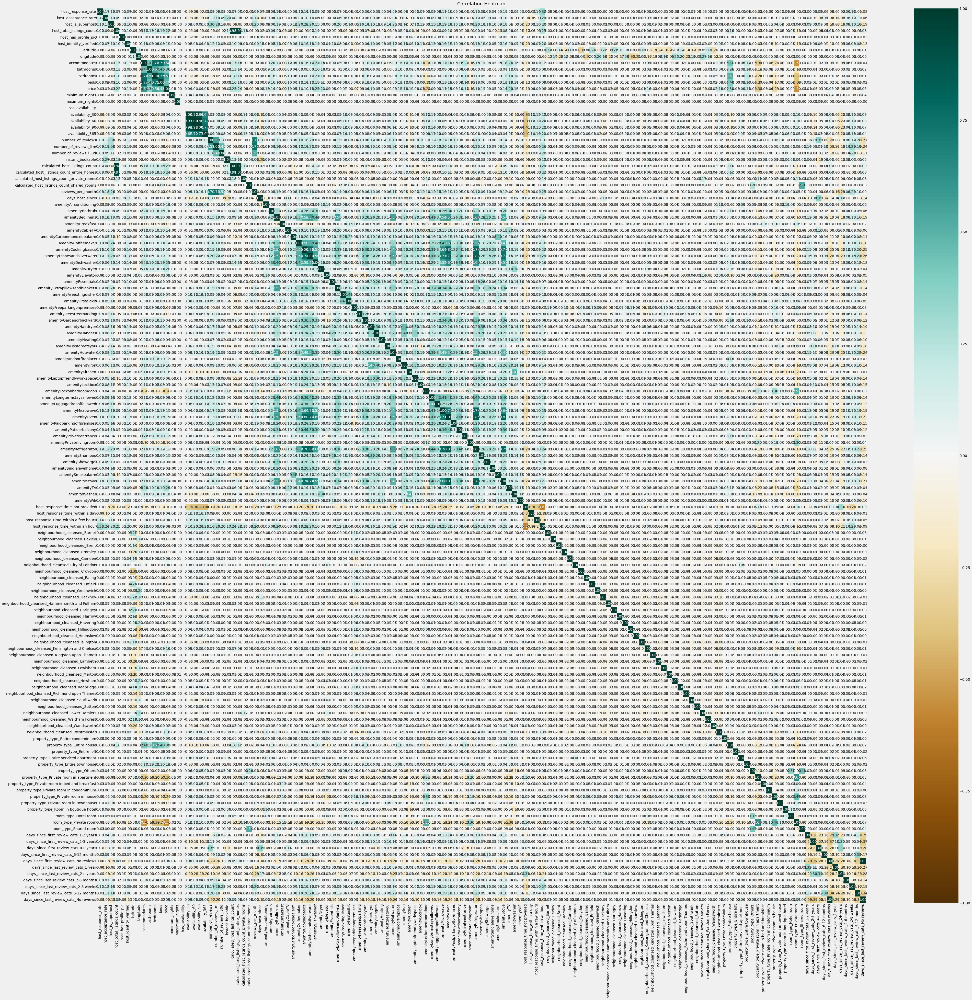

In [62]:
plt.figure(figsize=(60, 60))
feature_correlation = listings.corr()

# plt.figure(figsize=(5, 30))
# feature_correlation = listings.corr()[['price']].sort_values(by='price', ascending=False)

mask = (feature_correlation > 0.15) & (feature_correlation < 0.95) & (feature_correlation != 1)
# feature_correlation = feature_correlation[mask]

# Show all features.
# heatmap = sns.heatmap(feature_correlation, vmin=-1, vmax=1, annot=True, fmt=".2f", cmap='BrBG')

# Show only price feature
heatmap = sns.heatmap(feature_correlation, vmin=-1, vmax=1, annot=True, fmt=".2f", cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12)

In [63]:
feature_correlation_price = abs(feature_correlation['price'])
mask = (feature_correlation_price > 0.10) & (feature_correlation_price < 0.95) & (feature_correlation_price != 1)

# Columns to keep
columns_to_keep = list(feature_correlation_price[mask].index)

print(len(columns_to_keep))
columns_to_keep


39


['host_total_listings_count',
 'host_identity_verified',
 'longitude',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'calculated_host_listings_count',
 'calculated_host_listings_count_entire_homes',
 'amenityAirconditioning',
 'amenityBathtub',
 'amenityCableTV',
 'amenityCoffeemaker',
 'amenityDishesandsilverware',
 'amenityDishwasher',
 'amenityDryer',
 'amenityHairdryer',
 'amenityIndoorfireplace',
 'amenityIron',
 'amenityKitchen',
 'amenityLockonbedroomdoor',
 'amenityMicrowave',
 'amenityOven',
 'amenityPatioorbalcony',
 'amenityPrivateentrance',
 'amenityPrivatelivingroom',
 'amenityRefrigerator',
 'amenityShampoo',
 'amenityStove',
 'amenityTV',
 'amenityWasher',
 'host_response_time_not provided',
 'neighbourhood_cleansed_Kensington and Chelsea',
 'neighbourhood_cleansed_Westminster',
 'property_type_Entire house',
 'property_type_Entire townhouse',
 'property_type_Private room in apartment',
 'property_type_Private room in house',
 'room_type_Private room']

# Variance Inflation Factors (VIFs)

They are a great way to check for multicollinearity in your model. Multicollinearity is when there is high correlation between your features. It is an assumption of linear regression that your data does not have multicollinearity, so make sure to check this. You want your VIFs under 4.

In [64]:
from sklearn.preprocessing import MinMaxScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

final_listings = listings[columns_to_keep]
final_listings = final_listings.drop('longitude', axis=1)

# Improve performance of ML algorithm due to smaller values. ML algorithms see larger numbers as more impactful.
final_listings_scaled = MinMaxScaler().fit_transform(final_listings)
final_listings_scaled_df = pd.DataFrame(final_listings_scaled, columns=final_listings.columns)
final_listings_scaled_df.head()

# Visualize cleaned dataset
final_listings_corr = final_listings_scaled_df.corr()

# For each X, calculate VIF and save in dataframe
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(final_listings_corr.values, i) for i in range(final_listings_corr.shape[1])]
vif["features"] = final_listings_corr.columns
vif = vif.round(1)

pd.set_option('max_rows', None)
display(vif.sort_values('VIF', ascending=False))

,VIF,features
6,10355.6,calculated_host_listings_count
7,6165.8,calculated_host_listings_count_entire_homes
0,2694.5,host_total_listings_count
37,221.2,room_type_Private room
25,214.9,amenityRefrigerator
21,194.3,amenityOven
27,85.8,amenityStove
35,84.3,property_type_Private room in apartment
2,80.8,accommodates
12,76.1,amenityDishesandsilverware


In [65]:
final_listings_scaled_df.shape

(75287, 38)

# Modeling<a class="anchor" id="modeling"></a>

In [66]:
from sklearn.ensemble import RandomForestRegressor

# Baseline: Linear Regression without any feature selection or multicollinearity analysis

The model seems be overfitting the data. At first I thought this could because nomalizing the data would be removing trends in the data but after fitting the non-normalized data to the model it comes out to almost the same R2 scores.

In [67]:
from sklearn.metrics import explained_variance_score

sc = MinMaxScaler()
X = listings.drop('price', axis=1)
y = listings['price']

X = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

lm_model = RandomForestRegressor() # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )

print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))



        R2 for test data: 0.6713791412394875
        R2 for train data: 0.9523827404535347
        
        RMSE for test data: 38.21526068400816
        RMSE for train data: 14.462395092691423
        
        Mean Absolute Error for test data: 24.640860416179134
        Mean Absolute Error for train data: 9.280343931639745
    
	Explained variance: 0.6719023762155438
	Mean absolute error: 24.640860416179134
	R2 score: 0.6713791412394875


# Modelling with features that are greater than 0.10 in their correlation to price

In [68]:
#Split into explanatory and response variables
X = final_listings_scaled_df
y = listings['price']

#Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

lm_model = RandomForestRegressor() # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )

print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.5955330529326577
        R2 for train data: 0.9160954237063638
        
        RMSE for test data: 42.39657580265182
        RMSE for train data: 19.197772785217293
        
        Mean Absolute Error for test data: 27.909769455091382
        Mean Absolute Error for train data: 12.355902166136259
    
	Explained variance: 0.595921274169616
	Mean absolute error: 27.909769455091382
	R2 score: 0.5955330529326577


Text(0.5, 0, 'Price Actual')

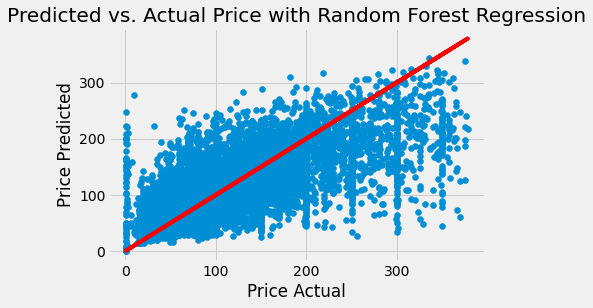

In [69]:
# Plot
plt.scatter(y_test, y_test_preds)
plt.plot(y_test, y_test,color='red')
plt.grid(True)
plt.title('Predicted vs. Actual Price with Random Forest Regression')
plt.ylabel('Price Predicted')
plt.xlabel('Price Actual')

# Collinearity analysis

In [70]:
transformed_df = pd.get_dummies(listings)

In [71]:
def multi_collinearity_heatmap(df, figsize=(11,9)):
    
    """
    Creates a heatmap of correlations between features in the df. A figure size can optionally be set.
    """
    
    # Set the style of the visualization
    sns.set(style="white")

    # Create a covariance matrix
    corr = df.corr()

    # Generate a mask the size of our covariance matrix
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=figsize)

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, vmax=corr[corr != 1.0].max().max());

C:\Users\Emre\AppData\Local\Temp/ipykernel_3812/1066291845.py:14: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


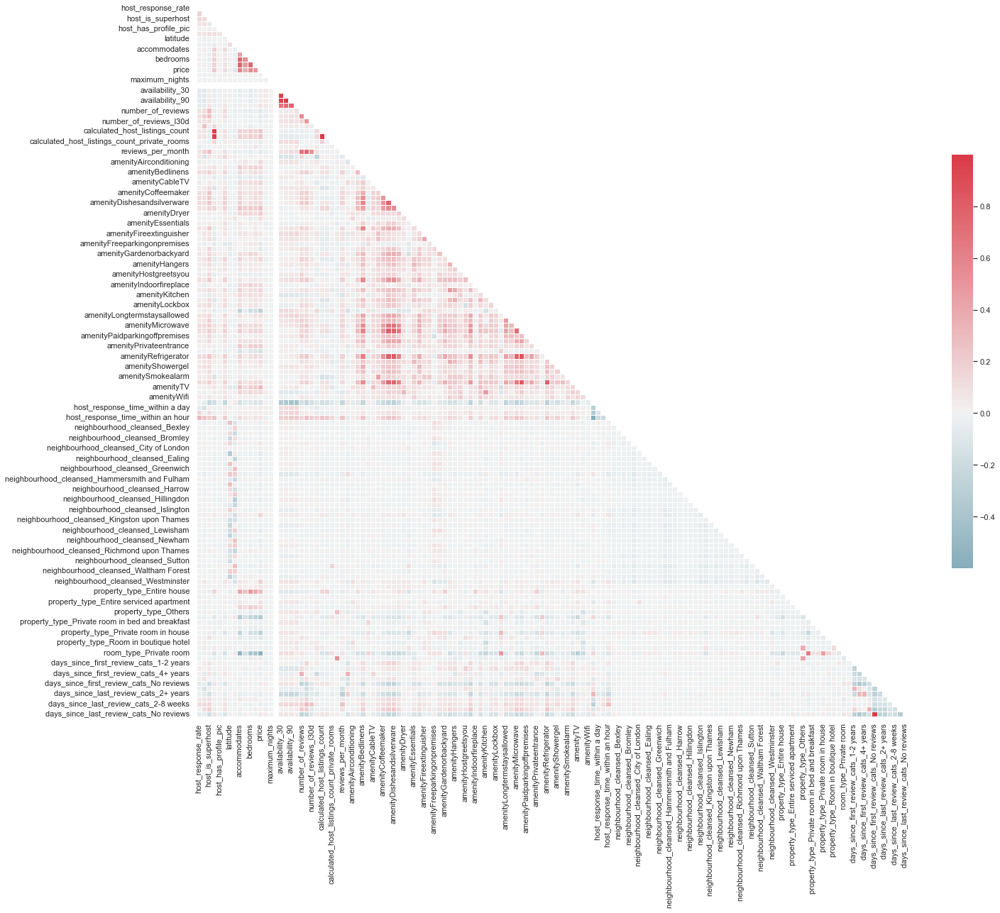

In [72]:
multi_collinearity_heatmap(transformed_df, figsize=(20,20))

C:\Users\Emre\AppData\Local\Temp/ipykernel_3812/1066291845.py:14: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


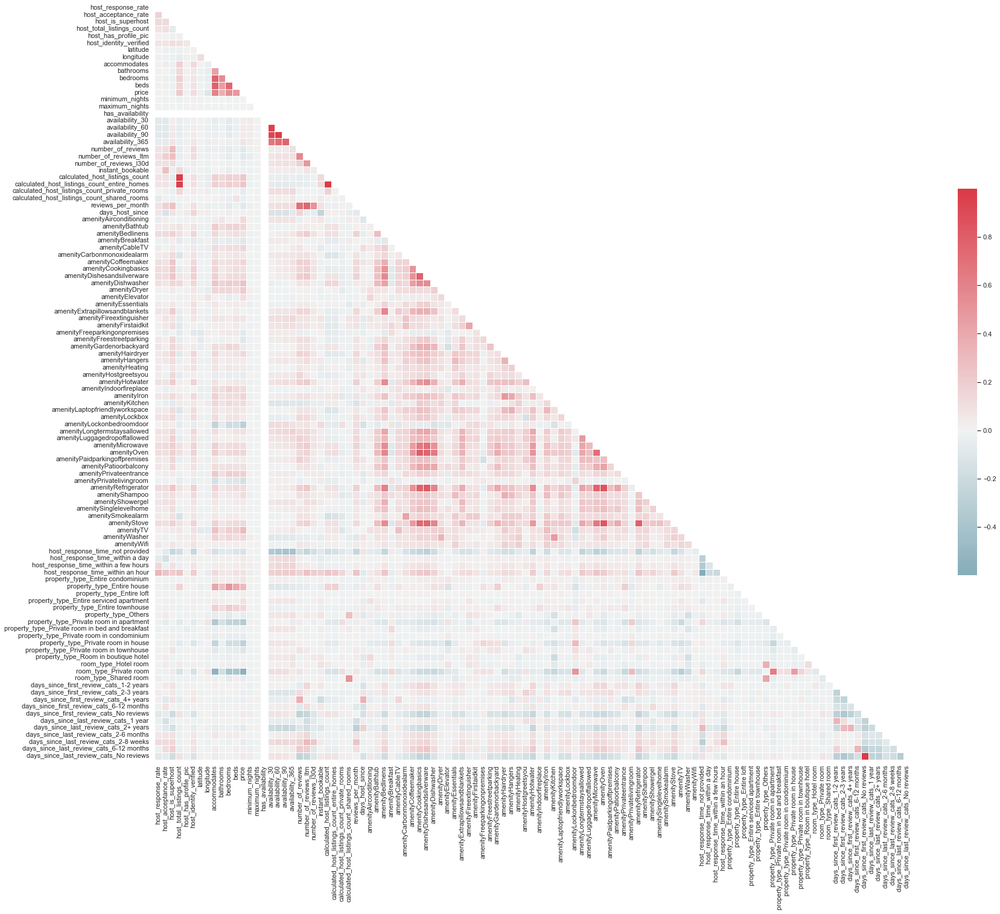

In [73]:
#It doesn't look like there are any significant collinear relationships with boroughs, 
#so these will temporarily be dropped to produce a clearer heatmap for the remaining features:

multi_collinearity_heatmap(transformed_df.drop(list(transformed_df.columns[transformed_df.columns.str.startswith('neighbourhood')]), axis=1), figsize=(25,22))

In [74]:
# Dropping collinear features
to_drop = ['beds',
           'bedrooms', 
           #'days_since_last_review_cats_No reviews',
           'calculated_host_listings_count',
           'calculated_host_listings_count_entire_homes',
           'number_of_reviews',
           'number_of_reviews_ltm',
           'number_of_reviews_l30d'
           ]

transformed_df.drop(to_drop, axis=1, inplace=True)

C:\Users\Emre\AppData\Local\Temp/ipykernel_3812/1066291845.py:14: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


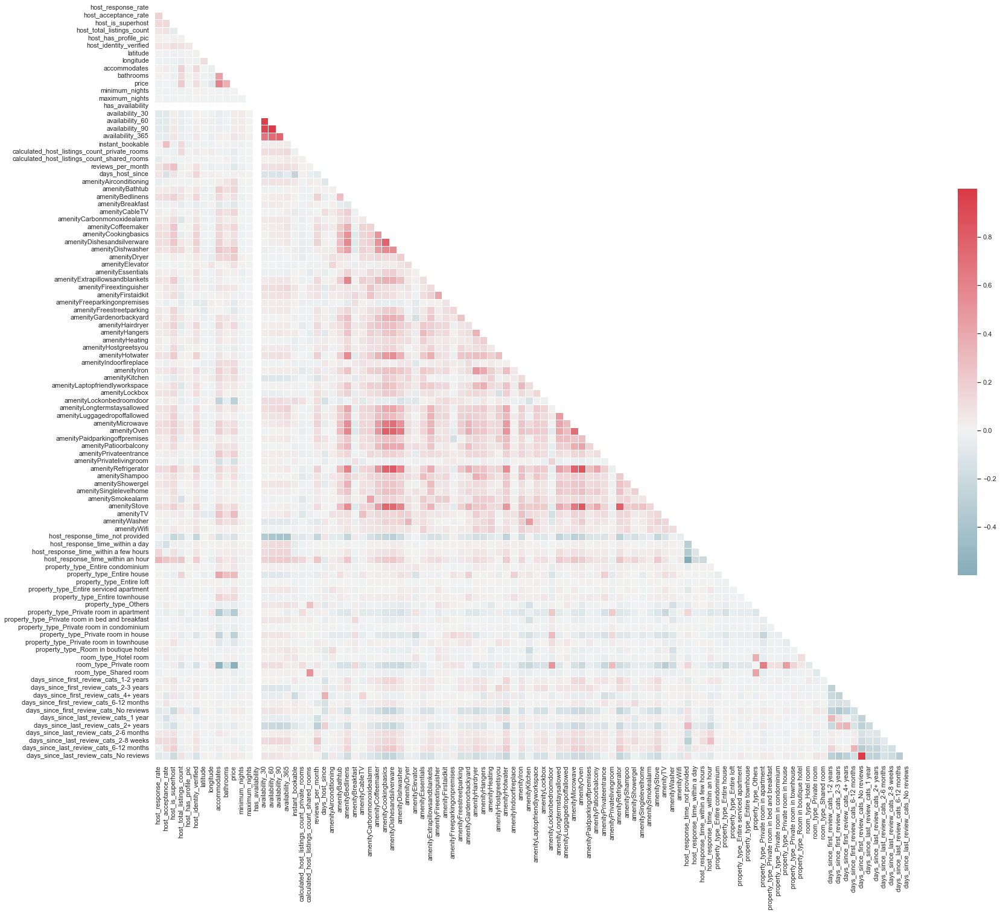

In [75]:
# Final assessment of multi-collinearity
multi_collinearity_heatmap(transformed_df.drop(list(transformed_df.columns[transformed_df.columns.str.startswith('neighbourhood')]), axis=1), figsize=(25,22))

In [76]:
transformed_df.head(1).T

,0
host_response_rate,100.00000
host_acceptance_rate,100.00000
host_is_superhost,0.00000
host_total_listings_count,3.00000
host_has_profile_pic,1.00000
host_identity_verified,1.00000
latitude,51.46225
longitude,-0.11732
accommodates,4.00000
bathrooms,1.00000


In [77]:
transformed_df.shape

(75287, 132)

In [78]:
# Separating X and y
X = transformed_df.drop(['price', 'has_availability', 'calculated_host_listings_count_shared_rooms'], axis=1)
y = transformed_df.price

# Scaling
scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))

In [79]:
# Splitting into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)


# Random Forest Regression Model

In [80]:
lm_model = RandomForestRegressor() # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.6562082740766673
        R2 for train data: 0.9506791902702125
        
        RMSE for test data: 38.55315574473222
        RMSE for train data: 14.769226805690447
        
        Mean Absolute Error for test data: 25.23075476569961
        Mean Absolute Error for train data: 9.502971347716008
    


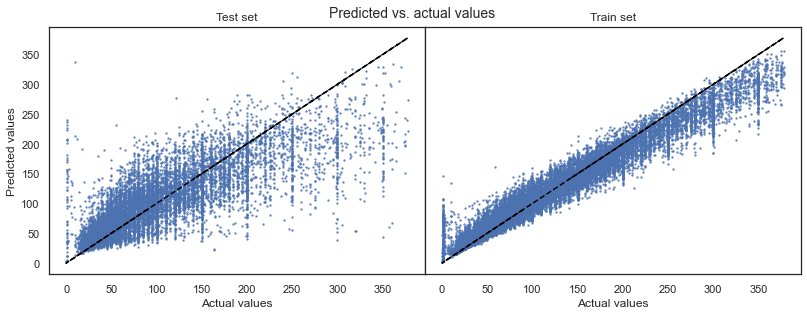

In [81]:
# Scatterplot of predicted vs. actual values
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle('Predicted vs. actual values', fontsize=14, y=1)
plt.subplots_adjust(top=0.93, wspace=0)
    
ax1.scatter(y_test, y_test_preds, s=2, alpha=0.7)
ax1.plot(y_test, y_test, color='black', linestyle='--')
ax1.set_title('Test set')
ax1.set_xlabel('Actual values')
ax1.set_ylabel('Predicted values')
    
ax2.scatter(y_train, y_train_preds, s=2, alpha=0.7)
ax2.plot(y_test, y_test, color='black', linestyle='--')
ax2.set_title('Train set')
ax2.set_xlabel('Actual values')
ax2.set_ylabel('')
ax2.set_yticklabels(labels='')
    
plt.show()

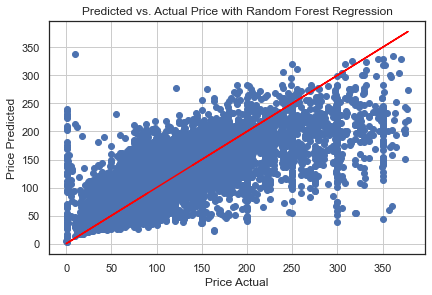

In [82]:
# Plot
plt.scatter(y_test, y_test_preds)
plt.plot(y_test,y_test,color='red')
plt.grid(True)
plt.title('Predicted vs. Actual Price with Random Forest Regression')
plt.ylabel('Price Predicted')
plt.xlabel('Price Actual');

# GridSearch and RandomSearch with cross-validation (cv)

From the data above, it is clear that the Random Forest Regressor model, with this data set and data cleaning applied, suffers from significant overfitting. So I think for this model it is more useful to tune the model using cross validation rather than the standard test-train split method.

Initially I did a GridSearch with cv = 3. It took a very long time and affected the performance of my laptop when I tried to do other work.

The second time, I choose to compare it using RandomSearch with cv = 10 instead.

The results is better with the parameters from the GridSearch.

# RandomizedSearchCV with CV = 10

In [83]:
from sklearn.model_selection import RandomizedSearchCV

X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = RandomForestRegressor()

# create Grid
param_grid = {'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 500, num = 5)],
              'max_features': ['auto', 'sqrt'], 
              'max_depth': [int(x) for x in np.linspace(10, 110, num = 6)],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4],
              'bootstrap': [True, False]}

param_grid['max_depth'].append(None)
print(param_grid)

# instantiate the tuned model
randomForest_grid_search = RandomizedSearchCV(lm_model, param_grid, n_iter = 100, cv=3, verbose = 2, random_state = 42, n_jobs=8)

# train the tuned model
randomForest_grid_search.fit(X_train, y_train)

# print best estimator parameters found during the grid search
print(randomForest_grid_search.best_params_)

#started at 10.19pm

{'n_estimators': [200, 275, 350, 425, 500], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 30, 50, 70, 90, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}
Fitting 3 folds for each of 100 candidates, totalling 300 fits
{'n_estimators': 350, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 70, 'bootstrap': False}


In [84]:
#using parameters given from RandomSearch
#using the X = transformed_df.drop(['price', 'has_availability', 'calculated_host_listings_count_shared_rooms'], axis=1)
#y = transformed_df.price

lm_model = RandomForestRegressor(n_estimators=350, min_samples_split=2, min_samples_leaf=1, max_features='sqrt', max_depth=70, bootstrap=False) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.6717361596151858
        R2 for train data: 0.9999995838537596
        
        RMSE for test data: 38.33426219103215
        RMSE for train data: 0.04265037750546988
        
        Mean Absolute Error for test data: 24.763610927031312
        Mean Absolute Error for train data: 0.001009260355619814
    


In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

# Scaling
scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))

#Splitting the data into train and test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#using parameters given from GridSearch
lm_model = xgboost.XGBRegressor(colsample_bytree=0.7, gamma=0.1, learning_rate=0.1, max_depth=6, n_estimators=150) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )



        R2 for test data: 0.6745768492697555
        R2 for train data: 0.7400490566967937
        
        RMSE for test data: 38.16803560639405
        RMSE for train data: 33.708978392917366
        
        Mean Absolute Error for test data: 24.541892734290954
        Mean Absolute Error for train data: 22.216957194203445
    


# Performed a GridSearch on XGBoost with cross validation = 3

Returns the following result:
    {'colsample_bytree': 0.6, 'gamma': 0.0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}
(workings for this can be found further down the notebook)

In [ ]:
#using parameters given from GridSearch
lm_model = xgboost.XGBRegressor(colsample_bytree=0.6, gamma=0.0, learning_rate=0.1, max_depth=7, n_estimators=200) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)


test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )



        R2 for test data: 0.6755388373077305
        R2 for train data: 0.7845906525380986
        
        RMSE for test data: 37.45360126931654
        RMSE for train data: 30.865614903011302
        
        Mean Absolute Error for test data: 24.353972727344527
        Mean Absolute Error for train data: 20.465784249634194
    


# Comparing results between using Standard or MinMax Scaler

The results from MinMax is slightly better:

Mean Absolute Error for test data using Standard: **29.67**.
Mean Absolute Error for test data using MinMax: **29.64**

RMSE for test data using Standard: **44.33**.
RMSE for test data using MinMax: **44.32**

R2 for test data using Standard: **0.5454**.
R2 for test data using MinMax: **0.5456**

We shall continue with MinMaxScaler in this case.

In [ ]:
#Perform Scaling
from sklearn.preprocessing import StandardScaler

# Separating X and y
X = transformed_df.drop(['price', 'has_availability', 'calculated_host_listings_count_shared_rooms'], axis=1)
y = transformed_df.price

# Scaling
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))

In [ ]:
# Splitting into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

In [ ]:
lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )

C:\Users\hui_z\anaconda3\envs\geo\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(



        R2 for test data: 0.5453759820514092
        R2 for train data: 0.5519353709191193
        
        RMSE for test data: 44.334152475195744
        RMSE for train data: 44.515677916596715
        
        Mean Absolute Error for test data: 29.67095235878202
        Mean Absolute Error for train data: 29.782247316379213
    


In [ ]:
# Separating X and y
X = transformed_df.drop(['price', 'has_availability', 'calculated_host_listings_count_shared_rooms'], axis=1)
y = transformed_df.price

# Scaling
scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))

# Splitting into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

Testing on Training model with PCA data

Going to try Random Forest

In [ ]:
'''A PCA model is fitted for 60 components on the training data.'''
pca = PCA(n_components=60, random_state=1024);
pca.fit(X)

PCA(n_components=60, random_state=1024)

In [ ]:
listings_pca = pca.transform(X);
X_p_train, X_p_test, y_p_train, y_p_test = train_test_split(listings_pca, y, test_size=0.33, random_state=1024)    

In [ ]:
rf_classifier_2 = RandomForestRegressor(n_estimators=100, max_depth=40, criterion='mse', random_state=1024);
rf_classifier_2.fit(X_p_train, y_p_train)

y_p_pred = rf_classifier_2.predict(X_p_test);
y_p_pred_tr = rf_classifier_2.predict(X_p_train);

In [ ]:
test_r2 = r2_score(y_p_test, y_p_pred)
train_r2 = r2_score(y_p_train, y_p_pred_tr)
test_rmse = mean_squared_error(y_p_test, y_p_pred) ** (1/2)
train_rmse = mean_squared_error(y_p_train, y_p_pred_tr) ** (1/2)

test_mae = mean_absolute_error(y_p_test, y_p_pred)
train_mae = mean_absolute_error(y_p_train, y_p_pred_tr)


print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.4866782066936498
        R2 for train data: 0.9259723536962964
        
        RMSE for test data: 47.223275122475506
        RMSE for train data: 18.112499689664006
        
        Mean Absolute Error for test data: 32.16681661666712
        Mean Absolute Error for train data: 12.204650943570828
    


In [ ]:
'''A PCA model is fitted for 60 components on the training data.'''
pca = PCA(n_components=60, random_state=1024);
pca.fit(X)

listings_pca = pca.transform(X);
X_p_train, X_p_test, y_p_train, y_p_test = train_test_split(listings_pca, y, test_size=0.33, random_state=1024) 

rf_classifier_2 = xgboost.XGBRegressor(colsample_bytree=0.6, gamma=0.0, learning_rate=0.1, max_depth=7, n_estimators=200);
rf_classifier_2.fit(X_p_train, y_p_train)

y_p_pred = rf_classifier_2.predict(X_p_test);
y_p_pred_tr = rf_classifier_2.predict(X_p_train);

test_r2 = r2_score(y_p_test, y_p_pred)
train_r2 = r2_score(y_p_train, y_p_pred_tr)
test_rmse = mean_squared_error(y_p_test, y_p_pred) ** (1/2)
train_rmse = mean_squared_error(y_p_train, y_p_pred_tr) ** (1/2)

test_mae = mean_absolute_error(y_p_test, y_p_pred)
train_mae = mean_absolute_error(y_p_train, y_p_pred_tr)


print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.4963291136937674
        R2 for train data: 0.7387070125865216
        
        RMSE for test data: 46.777248932396425
        RMSE for train data: 34.02869525924954
        
        Mean Absolute Error for test data: 31.63667832610832
        Mean Absolute Error for train data: 23.8385565550708
    


In [ ]:
'''A PCA model is fitted for 2 components on the training data.'''
pca = PCA(n_components=2, random_state=1024);
pca.fit(X)

listings_pca = pca.transform(X);
X_p_train, X_p_test, y_p_train, y_p_test = train_test_split(listings_pca, y, test_size=0.33, random_state=1024) 

rf_classifier_2 = xgboost.XGBRegressor(colsample_bytree=0.6, gamma=0.0, learning_rate=0.1, max_depth=7, n_estimators=200);
rf_classifier_2.fit(X_p_train, y_p_train)

y_p_pred = rf_classifier_2.predict(X_p_test);
y_p_pred_tr = rf_classifier_2.predict(X_p_train);

test_r2 = r2_score(y_p_test, y_p_pred)
train_r2 = r2_score(y_p_train, y_p_pred_tr)
test_rmse = mean_squared_error(y_p_test, y_p_pred) ** (1/2)
train_rmse = mean_squared_error(y_p_train, y_p_pred_tr) ** (1/2)

test_mae = mean_absolute_error(y_p_test, y_p_pred)
train_mae = mean_absolute_error(y_p_train, y_p_pred_tr)


print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.09755682129071996
        R2 for train data: 0.19866293949997094
        
        RMSE for test data: 62.61396205543286
        RMSE for train data: 59.592147291592845
        
        Mean Absolute Error for test data: 45.92213444885389
        Mean Absolute Error for train data: 43.655796737685264
    


In [ ]:
'''A PCA model is fitted for 30 components on the training data.'''
pca = PCA(n_components=30, random_state=1024);
pca.fit(X)

listings_pca = pca.transform(X);
X_p_train, X_p_test, y_p_train, y_p_test = train_test_split(listings_pca, y, test_size=0.33, random_state=1024) 

rf_classifier_2 = xgboost.XGBRegressor(colsample_bytree=0.6, gamma=0.0, learning_rate=0.1, max_depth=7, n_estimators=200);
rf_classifier_2.fit(X_p_train, y_p_train)

y_p_pred = rf_classifier_2.predict(X_p_test);
y_p_pred_tr = rf_classifier_2.predict(X_p_train);

test_r2 = r2_score(y_p_test, y_p_pred)
train_r2 = r2_score(y_p_train, y_p_pred_tr)
test_rmse = mean_squared_error(y_p_test, y_p_pred) ** (1/2)
train_rmse = mean_squared_error(y_p_train, y_p_pred_tr) ** (1/2)

test_mae = mean_absolute_error(y_p_test, y_p_pred)
train_mae = mean_absolute_error(y_p_train, y_p_pred_tr)


print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.46710707429271514
        R2 for train data: 0.6865707769328079
        
        RMSE for test data: 48.11508195675431
        RMSE for train data: 37.26929379152849
        
        Mean Absolute Error for test data: 32.774687414079104
        Mean Absolute Error for train data: 26.002334945571775
    


In [ ]:
'''A PCA model is fitted for 100 components on the training data.'''
pca = PCA(n_components=100, random_state=1024);
pca.fit(X)

listings_pca = pca.transform(X);
X_p_train, X_p_test, y_p_train, y_p_test = train_test_split(listings_pca, y, test_size=0.33, random_state=1024) 

rf_classifier_2 = xgboost.XGBRegressor(colsample_bytree=0.6, gamma=0.0, learning_rate=0.1, max_depth=7, n_estimators=200);
rf_classifier_2.fit(X_p_train, y_p_train)

y_p_pred = rf_classifier_2.predict(X_p_test);
y_p_pred_tr = rf_classifier_2.predict(X_p_train);

test_r2 = r2_score(y_p_test, y_p_pred)
train_r2 = r2_score(y_p_train, y_p_pred_tr)
test_rmse = mean_squared_error(y_p_test, y_p_pred) ** (1/2)
train_rmse = mean_squared_error(y_p_train, y_p_pred_tr) ** (1/2)

test_mae = mean_absolute_error(y_p_test, y_p_pred)
train_mae = mean_absolute_error(y_p_train, y_p_pred_tr)


print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.569231833930383
        R2 for train data: 0.8073383463210979
        
        RMSE for test data: 43.25965514934516
        RMSE for train data: 29.21992266859466
        
        Mean Absolute Error for test data: 28.847041576271877
        Mean Absolute Error for train data: 20.332763014018955
    


In [ ]:
'''A PCA model is fitted for 120 components on the training data.'''
pca = PCA(n_components=120, random_state=1024);
pca.fit(X)

listings_pca = pca.transform(X);
X_p_train, X_p_test, y_p_train, y_p_test = train_test_split(listings_pca, y, test_size=0.33, random_state=1024) 

rf_classifier_2 = xgboost.XGBRegressor(colsample_bytree=0.6, gamma=0.0, learning_rate=0.1, max_depth=7, n_estimators=200);
rf_classifier_2.fit(X_p_train, y_p_train)

y_p_pred = rf_classifier_2.predict(X_p_test);
y_p_pred_tr = rf_classifier_2.predict(X_p_train);

test_r2 = r2_score(y_p_test, y_p_pred)
train_r2 = r2_score(y_p_train, y_p_pred_tr)
test_rmse = mean_squared_error(y_p_test, y_p_pred) ** (1/2)
train_rmse = mean_squared_error(y_p_train, y_p_pred_tr) ** (1/2)

test_mae = mean_absolute_error(y_p_test, y_p_pred)
train_mae = mean_absolute_error(y_p_train, y_p_pred_tr)


print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.5877167448376563
        R2 for train data: 0.8040526282693997
        
        RMSE for test data: 42.32130983988281
        RMSE for train data: 29.4680326041333
        
        Mean Absolute Error for test data: 27.957239742705127
        Mean Absolute Error for train data: 20.41494545629687
    


In [ ]:
'''A PCA model is fitted for 110 components on the training data.'''
pca = PCA(n_components=110, random_state=1024);
pca.fit(X)

listings_pca = pca.transform(X);
X_p_train, X_p_test, y_p_train, y_p_test = train_test_split(listings_pca, y, test_size=0.33, random_state=1024) 

rf_classifier_2 = xgboost.XGBRegressor(colsample_bytree=0.6, gamma=0.0, learning_rate=0.1, max_depth=7, n_estimators=200);
rf_classifier_2.fit(X_p_train, y_p_train)

y_p_pred = rf_classifier_2.predict(X_p_test);
y_p_pred_tr = rf_classifier_2.predict(X_p_train);

test_r2 = r2_score(y_p_test, y_p_pred)
train_r2 = r2_score(y_p_train, y_p_pred_tr)
test_rmse = mean_squared_error(y_p_test, y_p_pred) ** (1/2)
train_rmse = mean_squared_error(y_p_train, y_p_pred_tr) ** (1/2)

test_mae = mean_absolute_error(y_p_test, y_p_pred)
train_mae = mean_absolute_error(y_p_train, y_p_pred_tr)


print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.583125798263648
        R2 for train data: 0.8004132884954182
        
        RMSE for test data: 42.556290247196294
        RMSE for train data: 29.74042919386214
        
        Mean Absolute Error for test data: 28.20038773403678
        Mean Absolute Error for train data: 20.689176149435593
    


# Original baseline linear regression model before I went back and did further cleaning.

The improvements from re-cleaning data:

R2 for test data went from 0.47 to 0.57.
RMSE for test data went from 68.90 to 43.58.
MAE for test data went from 38.47 to 28.97.



In [ ]:
#Perform Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.2, random_state=42)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )

print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))



        R2 for test data: 0.47096051271062955
        R2 for train data: 0.47578414083005294
        
        RMSE for test data: 68.90024428793005
        RMSE for train data: 68.6478235962039
        
        Mean Absolute Error for test data: 38.47029139154331
        Mean Absolute Error for train data: 37.976704000094934
    


In [ ]:
print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))

	Explained variance: 0.4709677791765473
	Mean absolute error: 38.47029139154331
	R2 score: 0.47096051271062955


# Fitting the Gradient Boosting Regression model to predict price

In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = GradientBoostingRegressor(random_state=0) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )



print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.5211314999586214
        R2 for train data: 0.5501892621334634
        
        RMSE for test data: 65.29214959219748
        RMSE for train data: 63.70581430143095
        
        Mean Absolute Error for test data: 34.676486403356016
        Mean Absolute Error for train data: 33.813819806012695
    
	Explained variance: 0.521139439916147
	Mean absolute error: 34.676486403356016
	R2 score: 0.5211314999586214


# Price Prediction using XGBoost

In [ ]:
import xgboost
from xgboost import plot_importance

X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = xgboost.XGBRegressor() # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)


test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.5898379887830136
        R2 for train data: 0.7843850467059867
        
        RMSE for test data: 60.42693257566465
        RMSE for train data: 44.10660195674622
        
        Mean Absolute Error for test data: 31.79550978343075
        Mean Absolute Error for train data: 25.58778742556826
    
	Explained variance: 0.5898506059330475
	Mean absolute error: 31.79550978343075
	R2 score: 0.5898379887830136


# Analysis:

Of the 3 models, XGBoost has the lowest error. However, the generalisation for XGBoost is the worst.




# Why?

In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = xgboost.XGBRegressor(colsample_bytree=0.7, gamma=0.2, learning_rate=0.1, 
                           max_depth=6, n_estimators=200, random_state=4) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)


test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.5978338858437842
        R2 for train data: 0.7497738465281185
        
        RMSE for test data: 59.835037750070356
        RMSE for train data: 47.51497574814371
        
        Mean Absolute Error for test data: 31.065266615460295
        Mean Absolute Error for train data: 26.570869910706723
    
	Explained variance: 0.5978738480429284
	Mean absolute error: 31.065266615460295
	R2 score: 0.5978338858437842


# GridSearch for XGBoost

In [ ]:
from sklearn.model_selection import GridSearchCV

X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = xgboost.XGBRegressor()

# create Grid
param_grid = {'n_estimators': [100, 150, 200],
              'learning_rate': [0.01, 0.05, 0.1], 
              'max_depth': [3, 4, 5, 6, 7],
              'colsample_bytree': [0.6, 0.7, 1],
              'gamma': [0.0, 0.1, 0.2]}

# instantiate the tuned model
booster_grid_search = GridSearchCV(lm_model, param_grid, cv=3, n_jobs=-1) # n_jobs is the number of cores. So I should do 1 or 2 so that it will not use all the core.

# train the tuned model
booster_grid_search.fit(X_train, y_train)

# print best estimator parameters found during the grid search
print(booster_grid_search.best_params_)

{'colsample_bytree': 0.6, 'gamma': 0.0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}


# Returns the following result:
    {'colsample_bytree': 0.6, 'gamma': 0.0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}

Start time for above gridsearch is 4.49pm on 24th Nov and returned result at 7.07pm

# Using the best estimator parameters from Grid Search

In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = xgboost.XGBRegressor(colsample_bytree=0.6, gamma=0.0, learning_rate=0.1, max_depth=7, n_estimators=200) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)


test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.6116862176999539
        R2 for train data: 0.8113090723790194
        
        RMSE for test data: 58.79551983240399
        RMSE for train data: 41.26099263051627
        
        Mean Absolute Error for test data: 30.56221232361796
        Mean Absolute Error for train data: 23.87194336800996
    
	Explained variance: 0.6117347582937875
	Mean absolute error: 30.56221232361796
	R2 score: 0.6116862176999539


In [ ]:
listings.shape

(76973, 133)

In [ ]:
listings.columns.to_list()

['id',
 'host_id',
 'host_response_rate',
 'host_acceptance_rate',
 'host_is_superhost',
 'host_total_listings_count',
 'host_has_profile_pic',
 'host_identity_verified',
 'latitude',
 'longitude',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'price',
 'minimum_nights',
 'maximum_nights',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'number_of_reviews',
 'number_of_reviews_ltm',
 'number_of_reviews_l30d',
 'instant_bookable',
 'calculated_host_listings_count',
 'calculated_host_listings_count_entire_homes',
 'calculated_host_listings_count_private_rooms',
 'reviews_per_month',
 'days_host_since',
 'amenity_Air_conditioning_',
 'amenity_Bathtub_',
 'amenity_Bed_linens_',
 'amenity_Breakfast_',
 'amenity_Cable_TV_',
 'amenity_Carbon_monoxide_alarm_',
 'amenity_Coffee_maker_',
 'amenity_Cooking_basics_',
 'amenity_Dishes_and_silverware_',
 'amenity_Dishwasher_',
 'amenity_Dryer_',
 'amenity_Elevator_',
 'amenity_Essentials_',
 'amenity_Extra_p

Variance inflation factor (VIF) is a measure of the amount of multicollinearity in a set of multiple regression variables.

We found the following three features have very high measure of multicollinearity:

calculated_host_listings_count

calculated_host_listings_count_entire_homes

host_total_listings_count


We will try to remove the following features to check if the results improve.

In [ ]:
listings = listings.drop(['host_total_listings_count'], axis=1)

In [ ]:
#Perform Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.2, random_state=42)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )

print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.4709088171830753
        R2 for train data: 0.4757583716069781
        
        RMSE for test data: 68.90361052764847
        RMSE for train data: 68.64951085853055
        
        Mean Absolute Error for test data: 38.47764098102821
        Mean Absolute Error for train data: 37.98484692968769
    
	Explained variance: 0.4709163069616279
	Mean absolute error: 38.47764098102821
	R2 score: 0.4709088171830753


In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = GradientBoostingRegressor(random_state=0) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )



print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.5201935614604629
        R2 for train data: 0.5487845982386343
        
        RMSE for test data: 65.35606073171456
        RMSE for train data: 63.8052066654774
        
        Mean Absolute Error for test data: 34.65374913158848
        Mean Absolute Error for train data: 33.81002405641049
    
	Explained variance: 0.5202019281752135
	Mean absolute error: 34.65374913158848
	R2 score: 0.5201935614604629


In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = xgboost.XGBRegressor() # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)


test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.5893092553680908
        R2 for train data: 0.7849007669816838
        
        RMSE for test data: 60.46586773749714
        RMSE for train data: 44.053822020654074
        
        Mean Absolute Error for test data: 31.890704626536905
        Mean Absolute Error for train data: 25.683431302217794
    
	Explained variance: 0.5893297217475573
	Mean absolute error: 31.890704626536905
	R2 score: 0.5893092553680908


In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = xgboost.XGBRegressor(colsample_bytree=0.6, gamma=0.0, learning_rate=0.1, max_depth=7, n_estimators=200) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)


test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.6059784600152998
        R2 for train data: 0.8086482206785588
        
        RMSE for test data: 59.22605613983664
        RMSE for train data: 41.55089802340637
        
        Mean Absolute Error for test data: 30.709469069467197
        Mean Absolute Error for train data: 24.006027153474125
    
	Explained variance: 0.6060196538013083
	Mean absolute error: 30.709469069467197
	R2 score: 0.6059784600152998


In [ ]:
listings = listings.drop(['calculated_host_listings_count', 'calculated_host_listings_count_entire_homes'], axis=1)

In [ ]:
listings.shape

(76973, 130)

In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.2, random_state=42)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )

print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.46914825687255
        R2 for train data: 0.47169775895621247
        
        RMSE for test data: 69.01815431424018
        RMSE for train data: 68.91486689131682
        
        Mean Absolute Error for test data: 38.662077085278305
        Mean Absolute Error for train data: 38.28277481676542
    
	Explained variance: 0.46915909558059876
	Mean absolute error: 38.662077085278305
	R2 score: 0.46914825687255


In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = GradientBoostingRegressor(random_state=0) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )



print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.5149467523933117
        R2 for train data: 0.5437251956523382
        
        RMSE for test data: 65.71243194798814
        RMSE for train data: 64.16192802672114
        
        Mean Absolute Error for test data: 34.92255124857549
        Mean Absolute Error for train data: 34.09090348201663
    
	Explained variance: 0.5149600644413597
	Mean absolute error: 34.92255124857549
	R2 score: 0.5149467523933117


In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = xgboost.XGBRegressor() # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)


test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.5748485905074279
        R2 for train data: 0.7865819816971237
        
        RMSE for test data: 61.521178119564546
        RMSE for train data: 43.88132204934289
        
        Mean Absolute Error for test data: 32.335754813266014
        Mean Absolute Error for train data: 25.667358637561023
    
	Explained variance: 0.5749095719507994
	Mean absolute error: 32.335754813266014
	R2 score: 0.5748485905074279


In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = xgboost.XGBRegressor(colsample_bytree=0.6, gamma=0.0, learning_rate=0.1, max_depth=7, n_estimators=200) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)


test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))


        R2 for test data: 0.6054218398243196
        R2 for train data: 0.8043500250809758
        
        RMSE for test data: 59.26787464584503
        RMSE for train data: 42.014970240525955
        
        Mean Absolute Error for test data: 31.002693131591858
        Mean Absolute Error for train data: 24.255152951446235
    
	Explained variance: 0.6054977554785557
	Mean absolute error: 31.002693131591858
	R2 score: 0.6054218398243196


# Analysis:

There isn't much improvement from removing the features with the highest measure of multicollinearity. 

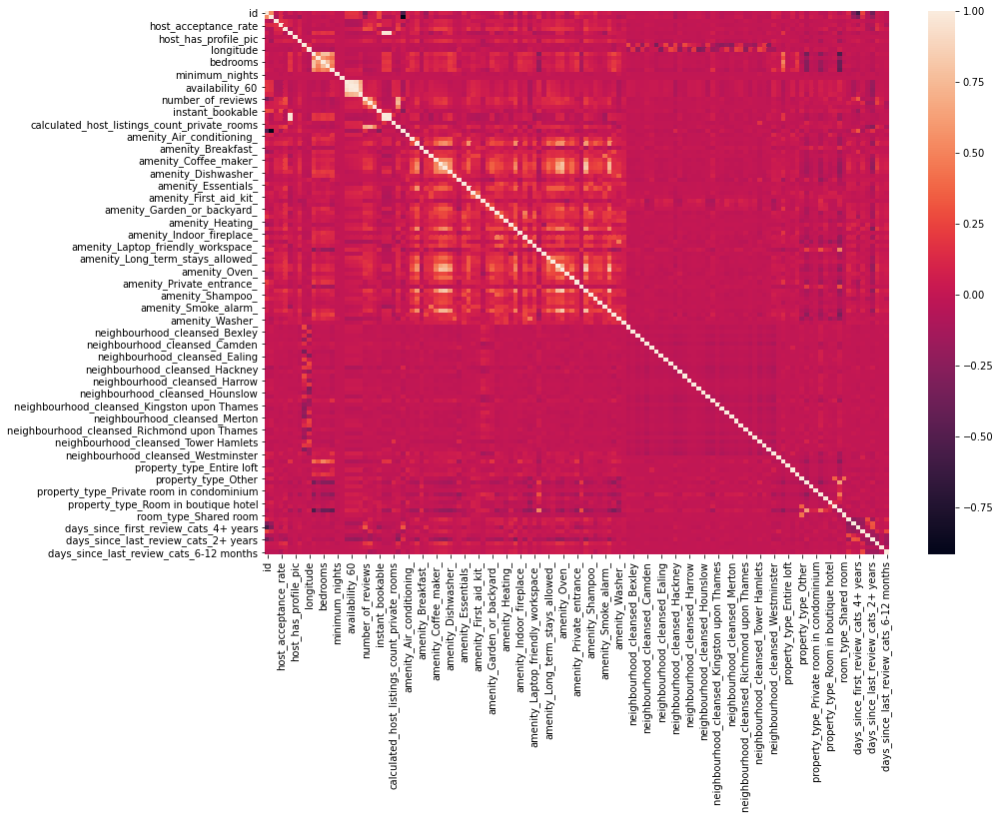

In [ ]:
'''The Seaborn Heatmap function can be used to plot a Correlation chart of all variables'''
plt.figure(figsize=(70,70))
corrs = listings.corr();
sns.heatmap(corrs);

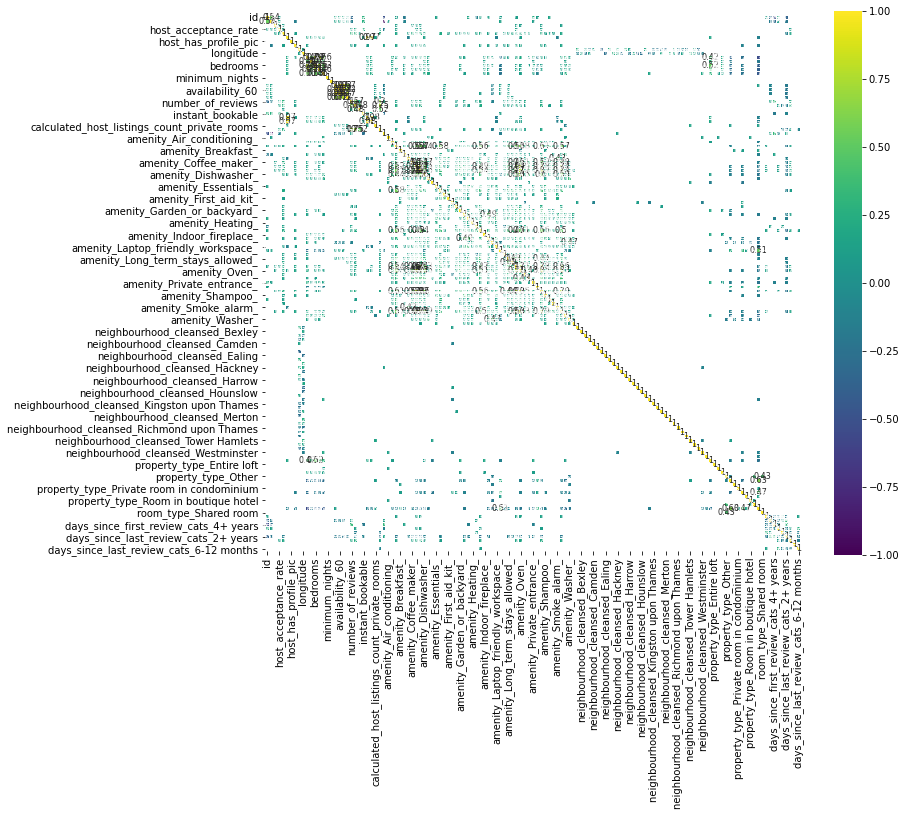

In [ ]:
corr = listings.corr();
plt.figure(figsize=(12, 10))

sns.heatmap(corr[(corr >= 0.1) | (corr <= -0.1)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(listings)

PCA(n_components=2)

In [ ]:
print(pca.components_)

[[ 7.14615864e-02  9.97443340e-01 -1.39206596e-08  2.95993214e-08
  -2.24305296e-10 -7.27468366e-08 -3.32743847e-11 -5.91289030e-10
  -1.80141494e-12 -1.39918404e-11 -1.15323666e-10 -9.10445106e-12
  -2.56212705e-10 -5.45017918e-11 -8.48685901e-09 -3.17170844e-10
  -1.59611347e-04  2.03109719e-08  4.21699447e-08  6.50429618e-08
   1.61816602e-07 -5.33474587e-08  3.35563133e-09  3.72175865e-10
   1.27597617e-09 -6.08026409e-08 -5.56246549e-08 -3.58911400e-09
   5.83201591e-10 -7.73697485e-06  2.63506240e-10 -2.04048010e-11
   2.25696998e-10  9.73503111e-12 -3.60993249e-10  1.32805300e-10
  -2.06500836e-10 -1.72539613e-12 -3.51950415e-11 -1.43683291e-10
  -2.21346527e-10 -1.04473768e-10  8.74003528e-11 -3.85066412e-11
   3.73664460e-10  2.33058248e-10  1.26792339e-10 -2.12912732e-11
  -1.10686849e-10 -1.78487924e-12  3.29806477e-10 -8.70753564e-11
  -2.80298743e-10  1.98865896e-10 -1.62026404e-10  1.53990050e-10
  -1.97508589e-10  7.82616451e-12  5.31786701e-10 -9.94477586e-11
   1.55307

In [ ]:
print(pca.explained_variance_)

[1.00858804e+16 1.23368572e+14]


In [ ]:
print(pca.explained_variance_ratio_)

[0.98631503 0.01206442]


# PCA without removing outliers in price.

(76973, 2)


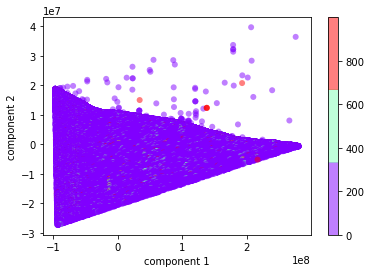

In [ ]:
projected = pca.fit_transform(listings)
print(projected.shape)

# plot this PCA projection
plt.scatter(projected[:, 0], projected[:, 1], c=listings['price'],
            edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('rainbow', 3))
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar()
plt.show;

# PCA after removing outliers @ price > 400

(75487, 2)


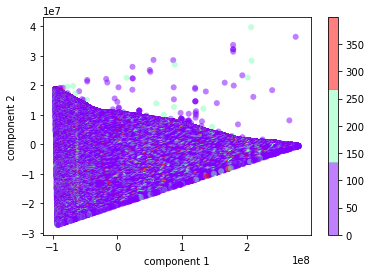

In [ ]:
projected = pca.fit_transform(listings)
print(projected.shape)

# plot this PCA projection
plt.scatter(projected[:, 0], projected[:, 1], c=listings['price'],
            edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('rainbow', 3))
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar()
plt.show;

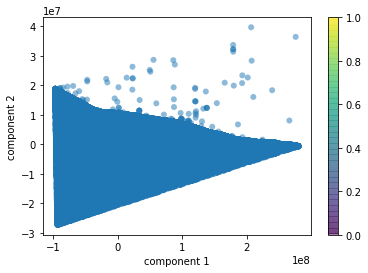

In [ ]:
# plot this PCA projection
plt.scatter(projected[:, 0], projected[:, 1],
            edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('rainbow', 3))
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar()
plt.show;

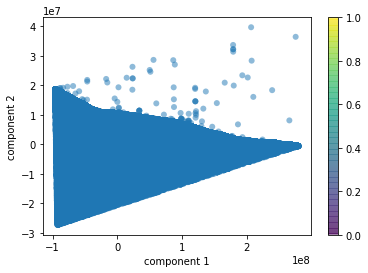

In [ ]:
# plot this PCA projection
plt.scatter(projected[:, 0], projected[:, 1],
            edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('rainbow', 3))
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar()
plt.show;

(76973, 10)


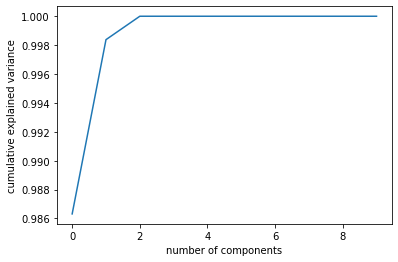

In [ ]:


pca = PCA(n_components=10)
pca.fit(X)

projected = pca.fit_transform(listings)
print(projected.shape)

#plot explained varianace against components
plt.figure
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.show()
plt.close()

(76973, 10)


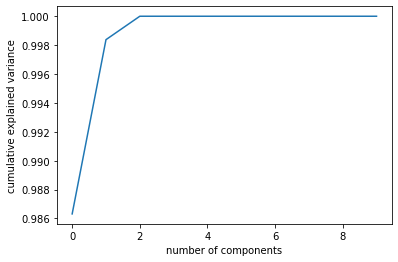

In [ ]:
from sklearn.decomposition import PCA
X = listings.drop('price', axis=1)

pca = PCA(n_components=10)
pca.fit(X)

projected = pca.fit_transform(listings)
print(projected.shape)

#plot explained varianace against components
plt.figure
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.show()
plt.close()



(76973, 5)


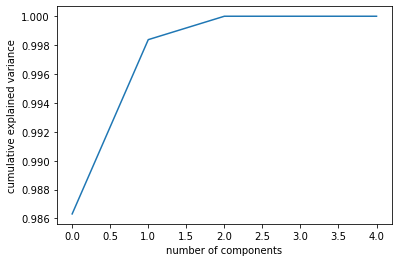

In [ ]:
pca = PCA(n_components=5)
pca.fit(listings)

projected = pca.fit_transform(listings)
print(projected.shape)

#plot explained varianace against components
plt.figure
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.show()
plt.close()

(76973, 3)


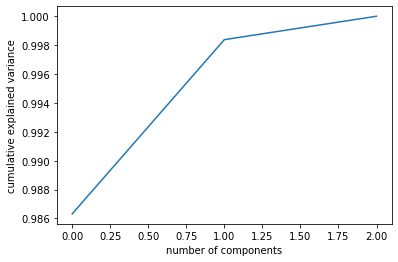

In [ ]:
pca = PCA(n_components=3)
pca.fit(listings)

projected = pca.fit_transform(listings)
print(projected.shape)

#plot explained varianace against components
plt.figure
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.show()
plt.close()

(76973, 2)


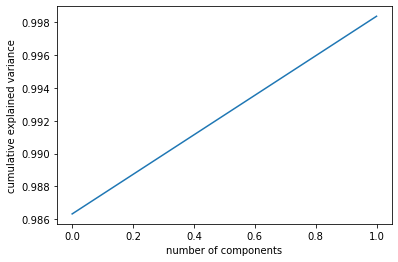

In [ ]:
pca = PCA(n_components=2)
pca.fit(listings)

projected = pca.fit_transform(listings)
print(projected.shape)

#plot explained varianace against components
plt.figure
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.show()
plt.close()

In [ ]:
get_params(deep=True)

<Figure size 3000x2000 with 0 Axes>

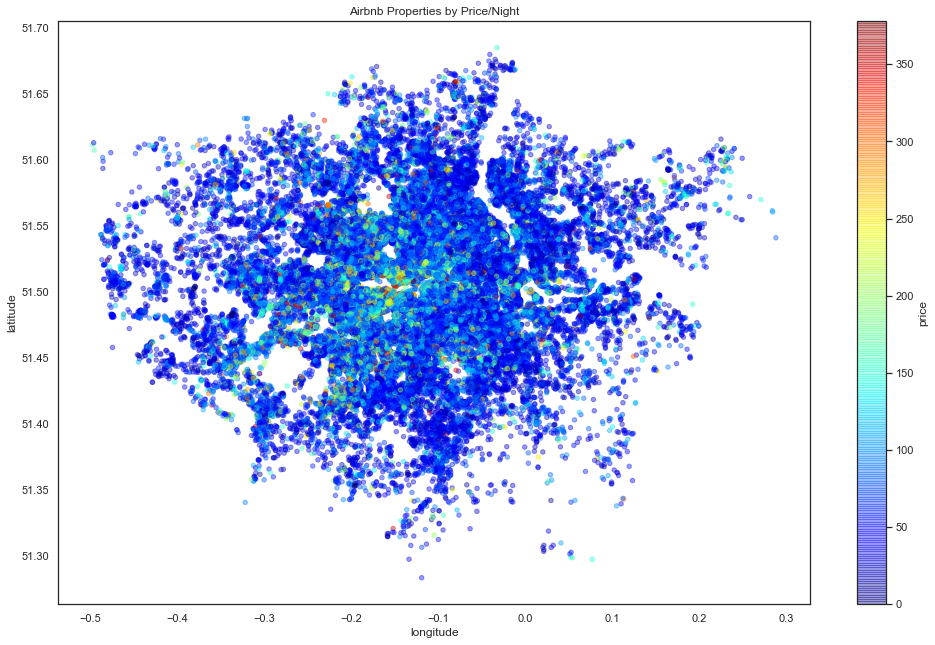

In [ ]:
#Map for list Average Price

plt.figure(figsize=(15,10),dpi=200),

listing_map=listings.plot(kind='scatter', x='longitude', y='latitude', c='price', 
                                      cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4,figsize=(15,10))
plt.title("Airbnb Properties by Price/Night")

plt.show()

In [ ]:
#Map for list Average Price

plt.figure(figsize=(15,10),dpi=200),

listing_map=listings.plot(kind='scatter', x='longitude', y='latitude', c='price', 
                                      cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4,figsize=(15,10))
plt.title("Airbnb Properties by Price/Night")

plt.show()

In [ ]:
from sklearn.ensemble import RandomForestRegressor


'''
A Random Forest Regressor is trained on the input values, to predict Price.

Predictions are made on both training and testing.
'''
X, y = listings.drop('price', axis=1), listings['price'];
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1024);

rf_classifier = RandomForestRegressor(n_estimators=100, max_depth=20, criterion='mse', random_state=1024);
rf_classifier.fit(X_train, y_train)

y_pred = rf_classifier.predict(X_test);
y_pred_tr = rf_classifier.predict(X_train);

In [ ]:
test_r2 = r2_score(y_test, y_pred)
train_r2 = r2_score(y_train, y_pred_tr)
test_rmse = mean_squared_error(y_test, y_pred) ** (1/2)
train_rmse = mean_squared_error(y_train, y_pred_tr) ** (1/2)

test_mae = mean_absolute_error(y_test, y_pred)
train_mae = mean_absolute_error(y_train, y_pred_tr)


print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.5841472370407268
        R2 for train data: 0.9131886073061956
        
        RMSE for test data: 61.67764289528763
        RMSE for train data: 27.806847941967717
        
        Mean Absolute Error for test data: 32.48947530307361
        Mean Absolute Error for train data: 17.007608203872707
    


In [ ]:
from sklearn.decomposition import PCA


'''A PCA model is fitted for 60 components on the training data.'''
pca = PCA(n_components=60, random_state=1024);
pca.fit(l_X)

PCA(n_components=60, random_state=1024)

In [ ]:
pca = PCA(n_components=70, random_state=1024);
pca.fit(l_X)

PCA(n_components=70, random_state=1024)

In [ ]:
listings_pca = pca.transform(l_X);
l_X_p_train, l_X_p_test, l_y_p_train, l_y_p_test = train_test_split(listings_pca, l_y, test_size=0.33, random_state=1024)    

In [ ]:
rf_classifier_2 = RandomForestRegressor(n_estimators=100, max_depth=40, criterion='mse', random_state=1024);
rf_classifier_2.fit(l_X_p_train, l_y_p_train)

l_y_p_pred = rf_classifier_2.predict(l_X_p_test);
l_y_p_pred_tr = rf_classifier_2.predict(l_X_p_train);

In [ ]:
#70 components

test_r2 = r2_score(l_y_p_test, l_y_p_pred)
train_r2 = r2_score(l_y_p_train, l_y_p_pred_tr)
test_rmse = mean_squared_error(l_y_p_test, l_y_p_pred) ** (1/2)
train_rmse = mean_squared_error(l_y_p_train, l_y_p_pred_tr) ** (1/2)

test_mae = mean_absolute_error(l_y_p_test, l_y_p_pred)
train_mae = mean_absolute_error(l_y_p_train, l_y_p_pred_tr)


print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.5009951671774691
        R2 for train data: 0.9289805260465092
        
        RMSE for test data: 67.56322138350455
        RMSE for train data: 25.150818652252504
        
        Mean Absolute Error for test data: 37.34439245554988
        Mean Absolute Error for train data: 13.919457866669742
    


In [ ]:
#10 components:

test_r2 = r2_score(l_y_p_test, l_y_p_pred)
train_r2 = r2_score(l_y_p_train, l_y_p_pred_tr)
test_rmse = mean_squared_error(l_y_p_test, l_y_p_pred) ** (1/2)
train_rmse = mean_squared_error(l_y_p_train, l_y_p_pred_tr) ** (1/2)

test_mae = mean_absolute_error(l_y_p_test, l_y_p_pred)
train_mae = mean_absolute_error(l_y_p_train, l_y_p_pred_tr)


print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.22844689651667305
        R2 for train data: 0.8897456872516475
        
        RMSE for test data: 84.01191489010098
        RMSE for train data: 31.337272453385495
        
        Mean Absolute Error for test data: 52.520074075620236
        Mean Absolute Error for train data: 19.57403488058938
    


In [ ]:
#60 components:

test_r2 = r2_score(l_y_p_test, l_y_p_pred)
train_r2 = r2_score(l_y_p_train, l_y_p_pred_tr)
test_rmse = mean_squared_error(l_y_p_test, l_y_p_pred) ** (1/2)
train_rmse = mean_squared_error(l_y_p_train, l_y_p_pred_tr) ** (1/2)

test_mae = mean_absolute_error(l_y_p_test, l_y_p_pred)
train_mae = mean_absolute_error(l_y_p_train, l_y_p_pred_tr)


print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.49831934357971164
        R2 for train data: 0.9282921429678435
        
        RMSE for test data: 67.74412699612648
        RMSE for train data: 25.272416609514416
        
        Mean Absolute Error for test data: 37.46697571829519
        Mean Absolute Error for train data: 13.977728792823665
    


# Fitting the Linear Regression model to predict price

In [ ]:
#Split into explanatory and response variables
X = listings.drop('price', axis=1)
y = listings['price']

#Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=42)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.4651214223887119
        R2 for train data: 0.4786803484948995
        
        RMSE for test data: 69.00497996150229
        RMSE for train data: 68.58295763771645
        
        Mean Absolute Error for test data: 38.52955397265066
        Mean Absolute Error for train data: 38.00227442626684
    


In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.4651214223887119
        R2 for train data: 0.4786803484948994
        
        RMSE for test data: 69.00497996150229
        RMSE for train data: 68.58295763771645
        
        Mean Absolute Error for test data: 38.529553972650604
        Mean Absolute Error for train data: 38.00227442626678
    


In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))

	Explained variance: 0.46513177380605664
	Mean absolute error: 38.529553972650604
	R2 score: 0.4651214223887119


In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = GradientBoostingRegressor(random_state=0) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))

	Explained variance: 0.521139439916147
	Mean absolute error: 34.676486403356016
	R2 score: 0.5211314999586214


In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = Lasso(alpha=0.01) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))

	Explained variance: 0.4650414842535976
	Mean absolute error: 38.51125614867906
	R2 score: 0.46503187314141126


C:\Users\hui_z\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5086213.538542122, tolerance: 48614.29268418549
  model = cd_fast.enet_coordinate_descent(


In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = Ridge(alpha=0.01) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))

	Explained variance: 0.4651318046217898
	Mean absolute error: 38.52954905473656
	R2 score: 0.4651214535455176


In [ ]:
X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = DecisionTreeRegressor(random_state=0) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))

	Explained variance: 0.11873870818093857
	Mean absolute error: 44.8528494716785
	R2 score: 0.11809883324028592


In [ ]:
import xgboost
from xgboost import plot_importance

X = listings.drop('price', axis=1)
y = listings['price']

X_sc = sc.fit_transform(X)

#Splitting the data into train and test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.3, random_state=42)

lm_model = xgboost.XGBRegressor() # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

print("\tExplained variance:", explained_variance_score(y_test, y_test_preds))
print("\tMean absolute error:", mean_absolute_error(y_test, y_test_preds))
print("\tR2 score:", r2_score(y_test, y_test_preds))

	Explained variance: 0.5898506059330475
	Mean absolute error: 31.79550978343075
	R2 score: 0.5898379887830136


# Analysis:

LinearRegression(normalize=True):
    Explained variance: 0.46513177380605664
    Mean absolute error: 38.529553972650604
	R2 score: 0.4651214223887119
    
GradientBoostingRegressor(random_state=0):
    Explained variance: 0.521139439916147
	Mean absolute error: 34.676486403356016
	R2 score: 0.5211314999586214

Lasso(alpha=0.01):
    Explained variance: 0.4650414842535976
	Mean absolute error: 38.51125614867906
	R2 score: 0.46503187314141126

Ridge(alpha=0.01):
    Explained variance: 0.4651318046217898
	Mean absolute error: 38.52954905473656
	R2 score: 0.4651214535455176

DecisionTreeRegressor(random_state=0):
    Explained variance: 0.11873870818093857
	Mean absolute error: 44.8528494716785
	R2 score: 0.11809883324028592
    
xgboost.XGBRegressor():
    Explained variance: 0.5898506059330475
	Mean absolute error: 31.79550978343075
	R2 score: 0.5898379887830136
    
XGBoost is the best model. Followed by GradientBoostingRegressor. The worst performer is the DecisionTreeRegressor.    
    
    



In [ ]:
from sklearn.model_selection import GridSearchCV

parameters = { 'loss' : ['ls', 'lad', 'huber', 'quantile'],
              'learning_rate' : (0.05,0.25,0.50,1),
              'criterion' : ['friedman_mse', 'mse', 'mae'],
              'max_features' : ['auto', 'sqrt', 'log2']
             }

grid = GridSearchCV(GradientBoostingRegressor(),parameters)
model = grid.fit(X_sc,y)

print(model.best_params_,'\n')
print(model.best_estimator_,'\n')

C:\Users\hui_z\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:1630: FutureWarning: criterion='mae' was deprecated in version 0.24 and will be removed in version 1.1 (renaming of 0.26). The correct way of minimizing the absolute error is to use  loss='lad' instead.
  warnings.warn("criterion='mae' was deprecated in version 0.24 and "


KeyboardInterrupt: 

In [ ]:
def coef_weights(coefficients, X_train):
    '''
    INPUT:
    coefficients - the coefficients of the linear model 
    X_train - the training data, so the column names can be used
    OUTPUT:
    coefs_df - a dataframe holding the coefficient, estimate, and abs(estimate)
    
    Provides a dataframe that can be used to understand the most influential coefficients
    in a linear model by providing the coefficient estimates along with the name of the 
    variable attached to the coefficient.
    '''
    coefs_df = pd.DataFrame()
    coefs_df['feature'] = X_train.columns
    coefs_df['coefs'] = lm_model.coef_
    coefs_df['abs_coefs'] = np.abs(lm_model.coef_)
    coefs_df = coefs_df.sort_values('feature', ascending=False)
    return coefs_df

#Use the function
coef_df = coef_weights(lm_model.coef_, X_train)

#A quick look at the top results
coef_df.head(10)

AttributeError: Coefficients are not defined for Booster type None

# Price Prediction using XGBoost

In [ ]:
import xgboost
from xgboost import plot_importance

#Instantiate
xgb_model = xgboost.XGBRegressor()
#Fit
xgb_model.fit(X_train, y_train)
#Predict
training_preds_xgb_reg = xgb_model.predict(X_train)
test_preds_xgb_reg = xgb_model.predict(X_test)


print("""
        Training RMSE: {}
        Test RMSE: {}
        
        Training R2: {}
        Test R2: {}
        
        Training Mean Absolute Error: {}
        Test Mean Absolute Error: {}
    """.format(mean_squared_error(y_train, training_preds_xgb_reg) ** (1/2),
               mean_squared_error(y_test, test_preds_xgb_reg) ** (1/2),
               r2_score(y_train, training_preds_xgb_reg),
               r2_score(y_test, test_preds_xgb_reg),
               mean_absolute_error(y_train, training_preds_xgb_reg),
               mean_absolute_error(y_test, test_preds_xgb_reg)
              )
     )


        Training RMSE: 44.10660195674622
        Test RMSE: 60.42693257566465
        
        Training R2: 0.7843850467059867
        Test R2: 0.5898379887830136
        
        Training Mean Absolute Error: 25.58778742556826
        Test Mean Absolute Error: 31.79550978343075
    


# Feature importance

In [ ]:
ft_weights_xgb_reg = pd.DataFrame(xgb_model.feature_importances_, columns=['weight'], index=X_train.columns)
ft_weights_xgb_reg = ft_weights_xgb_reg.sort_values('weight')

# Plotting feature importances
plt.figure(figsize=(8, 40))
plt.barh(ft_weights_xgb_reg.index, ft_weights_xgb_reg.weight, align='center') 
plt.xlabel("Feature importance")
plt.margins(y=0.01)
plt.show()
ft_weights_xgb_reg.sort_values(by='weight', ascending=False)[:10]

AttributeError: 'numpy.ndarray' object has no attribute 'columns'

# Top 10 predictors of price (i.e., having the highest weight) were found to be:
1. If the Room type is private room
2. Number of bedrooms
3. Number of persons the property can accommodate
4. Number of bathrooms
5. If the Room type is shared room
6. Review scores related to location is 9/10
7. If the property is in Kensington and Chelsea
8. If the property is in Westminster
9. How many days are available to book out of the next 60?
10. Number of listings per host


In [ ]:
#Split into explanatory and response variables
X = listings.drop('price', axis=1)
y = listings['price']

#Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )

In [ ]:
#Use the function
coef_df = coef_weights(lm_model.coef_, X_train)

#A quick look at the top results
coef_df.head(10)

In [ ]:
#Instantiate
xgb_model = xgboost.XGBRegressor()
#Fit
xgb_model.fit(X_train, y_train)
#Predict
training_preds_xgb_reg = xgb_model.predict(X_train)
test_preds_xgb_reg = xgb_model.predict(X_test)


print("""
        Training RMSE: {}
        Test RMSE: {}
        
        Training R2: {}
        Test R2: {}
        
        Training Mean Absolute Error: {}
        Test Mean Absolute Error: {}
    """.format(mean_squared_error(y_train, training_preds_xgb_reg) ** (1/2),
               mean_squared_error(y_test, test_preds_xgb_reg) ** (1/2),
               r2_score(y_train, training_preds_xgb_reg),
               r2_score(y_test, test_preds_xgb_reg),
               mean_absolute_error(y_train, training_preds_xgb_reg),
               mean_absolute_error(y_test, test_preds_xgb_reg)
              )
     )

# Changing the train/test ratio from 30% to 20% improved the difference very slightly.

At 20% ratio:
    
Training_RMSE: 31.689301450306285
Test_RMSE: 39.05519061852682
Difference = -7.365889168220537
        
Training R2: 0.7824122337376805
Test R2: 0.674449952053068
Difference = 0.10796228168461253

Training Mean Absolute Error: 20.964657084147646
Test Mean Absolute Error: 24.943384564637245
Difference = -3.9787274804895993


At 30% ratio:

Training RMSE: 31.04369042740181
Test RMSE: 39.38049355961975
Difference = -8.336803132217941
        
Training R2: 0.7920110261892446
Test R2: 0.6642749797025237
Difference = 0.12773604648672088
        
Training Mean Absolute Error: 20.688701433547962
Test Mean Absolute Error: 25.140308829905546
Difference = -4.451607396357584




# The result is not very impressive, but this is given that no feature selection was performed on the dataset.
